In [26]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import matplotlib

## Conversion of eV into Rydberg for SED (data goes into Cloudy)

In [2]:
file = pd.read_csv('Book.csv')
file

,x,y
0,0.000090,9.109960e+11
1,0.000095,9.886420e+11
2,0.000104,1.273700e+12
3,0.000116,1.654240e+12
4,0.000130,2.164260e+12
...,...,...
84,923.395635,2.518730e+12
85,1013.694326,1.886700e+12
86,1110.748743,1.377430e+12
87,1199.061816,1.048330e+12


In [3]:
ryd_energy = np.array(file['x'])/13.6057039763
flux = np.array(file['y'])*10**(-26)
df = pd.DataFrame(ryd_energy)
df['y']=flux

In [5]:
df.to_csv('ryd_energy.csv') #Saving the information from above to import into Cloudy later

## Plotting the Different Intensity Elements and Xi

In [3]:
intensity_temp_1 = pd.read_csv('yaxisnew.csv') #This is actually the z axis 
intensity_temp = intensity_temp_1.iloc[: , 1:-1]


In [4]:
Xi = np.linspace(0,5, 21) #Creating this on my own because I know the exact values already
Xi

array([0.  , 0.25, 0.5 , 0.75, 1.  , 1.25, 1.5 , 1.75, 2.  , 2.25, 2.5 ,
       2.75, 3.  , 3.25, 3.5 , 3.75, 4.  , 4.25, 4.5 , 4.75, 5.  ])

In [5]:
a = '\u03BE'
print(a)

ξ


[0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 4.02e+00 8.89e+02 1.97e+04
 6.01e+04 1.27e+05 2.52e+05 4.92e+05 9.43e+05 1.77e+06 3.29e+06 6.11e+06
 1.14e+07 2.18e+07 4.28e+07 8.68e+07 1.80e+08]


TypeError: __init__() got an unexpected keyword argument 'color'

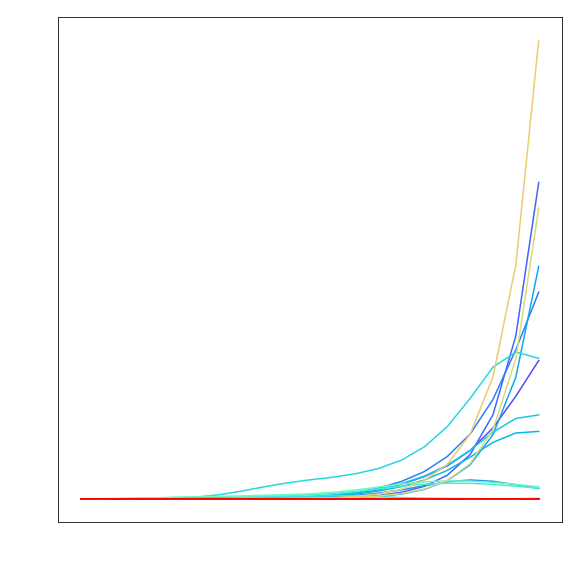

In [11]:
#21.6

intensity_temp_1 = pd.read_csv('yaxisnew_abs.csv') #This is actually the z axis 
intensity_temp = intensity_temp_1.iloc[: , 1:-1]

Xi = np.linspace(0,5, 21) #Creating this on my own because I know the exact values already
Xi

a = '\u03BE'

print(np.array(intensity_temp)[:,21])
plt.figure(figsize=(8,8))
plt.rcParams["figure.figsize"] = [0, 16]
plt.rcParams["figure.autolayout"] = True
colors = plt.cm.rainbow(np.linspace(0, 1, len(intensity_temp.columns)))
for i in range(len(np.array(intensity_temp)[0])):
    plt.plot(Xi, np.array(intensity_temp)[:,i], color=colors[i], ms=0.5, label = str(intensity_temp.columns[i][0:4])
                                                                          +' : '+str(intensity_temp.columns[i][5:-1]))
plt.xlabel('log('+a+')', fontsize=18, fontname= 'Times', color='white')
plt.ylabel('Intensity [erg $cm^2$ $s^{-1}$]', fontsize=18, fontname= 'Times', color='white')
plt.tick_params(colors='white', which='both')
plt.legend(loc='center right', bbox_to_anchor=(1.30, 0.5), color='white')
plt.text(1.3,317*10**6, 'Emission-Line Intensity', font='times', fontsize=18, color='white') 
plt.text(0.55,303*10**6, 'as a Function of Ionization Parameter', font='times', fontsize=18, color='white') 
plt.title('Integrated Emission-Line Intensity as a Function of Ionization Parameter', fontsize=14, fontname= 'Times')
plt.savefig('Intensity_vs_Xi_no_hydrogen', dpi=200, transparent=True)



[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 5.97325409e-07 1.64935065e-04 4.45701357e-03
 1.65564738e-02 4.31972789e-02 1.01612903e-01 2.12068966e-01
 3.86475410e-01 6.27659574e-01 9.79166667e-01 1.59947644e+00
 2.84289277e+00 5.64766839e+00 1.25513196e+01 3.14492754e+01
 8.53080569e+01]


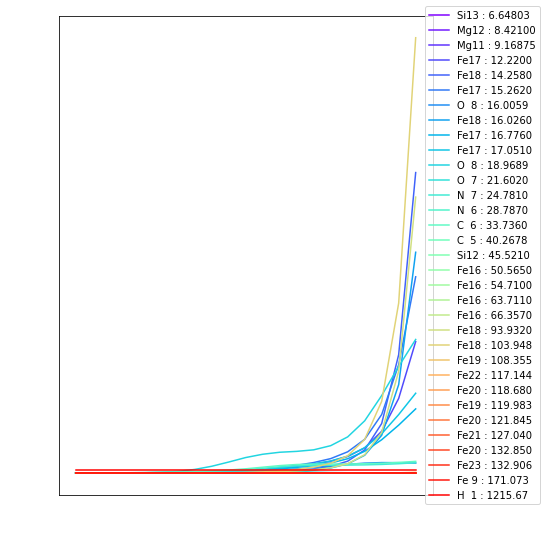

SystemError: tile cannot extend outside image

<Figure size 0x1152 with 0 Axes>

In [46]:
intensity_temp_1 = pd.read_csv('yaxisnew_abs.csv') #This is actually the z axis 
intensity_temp = intensity_temp_1.iloc[: , 1:]

#This code normalizes the data with respect to the Hydrogen Line
for idc, column_name in enumerate(intensity_temp.columns):
    last_column_name = intensity_temp.columns[-1]
    intensity_temp[column_name] = intensity_temp[column_name]/intensity_temp[last_column_name]

a = '\u03BE'

#21.6
print(np.array(intensity_temp)[:,21])
plt.figure(figsize=(8,8))
plt.rcParams["figure.figsize"] = [0, 16]
plt.rcParams["figure.autolayout"] = True
colors = plt.cm.rainbow(np.linspace(0, 1, len(intensity_temp.columns)))
for i in range(len(np.array(intensity_temp)[0])):
    plt.plot(Xi, np.array(intensity_temp)[:,i], color=colors[i], ms=0.5, label = str(intensity_temp.columns[i][0:4])
                                                                          +' : '+str(intensity_temp.columns[i][5:-1]))
    
    
plt.xlabel('log('+a+')', fontsize=24, fontname= 'Times', color='white')
plt.ylabel('Line to Continuum Ratio', fontsize=24, fontname= 'Times', color='white')
plt.legend(loc='center right', bbox_to_anchor=(1.30, 0.5))
plt.tick_params(colors='white', which='both')
plt.text(0.0,130, 'Emission-Line Intensity', font='times', fontsize=22, color='white') 
plt.text(0.0,123, 'as a Function of Ionization Parameter', font='times', fontsize=22, color='white')
plt.show()
plt.savefig('Presentation_Intensity_vs_Xi_with_hydrogen', dpi=200, transparent=True)



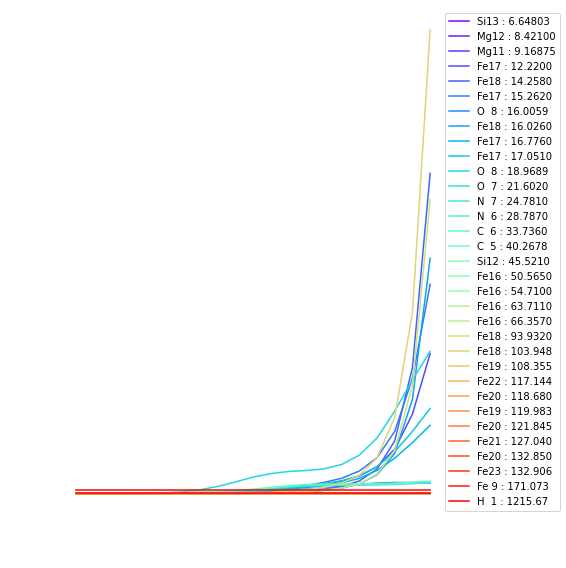

In [51]:
fig, ax = plt.subplots(figsize=(8,8))

plt.rcParams["figure.figsize"] = [0, 16]
plt.rcParams["figure.autolayout"] = True
colors = plt.cm.rainbow(np.linspace(0, 1, len(intensity_temp.columns)))


for i in range(len(np.array(intensity_temp)[0])):
    ax.plot(Xi, np.array(intensity_temp)[:,i], color=colors[i], ms=0.5, label = str(intensity_temp.columns[i][0:4])
                                                                          +' : '+str(intensity_temp.columns[i][5:-1]))
    
    
ax.set_xlabel('log('+a+')', fontsize=24, fontname= 'Times', color='white')
ax.set_ylabel('Line to Continuum Ratio', fontsize=24, fontname= 'Times', color='white')
ax.legend(loc='center right', bbox_to_anchor=(1.30, 0.5))
ax.tick_params(colors='white', which='both')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white')
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.text(0.0,130, 'Emission-Line Intensity', font='times', fontsize=22, color='white') 
ax.text(0.0,123, 'as a Function of Ionization Parameter', font='times', fontsize=22, color='white')
#plt.show()
plt.savefig('Presentation_Intensity_vs_Xi_with_hydrogen', dpi=200, transparent=True)

<ipython-input-9-2ace4e983ae3>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8,8))


<Figure size 576x576 with 0 Axes>

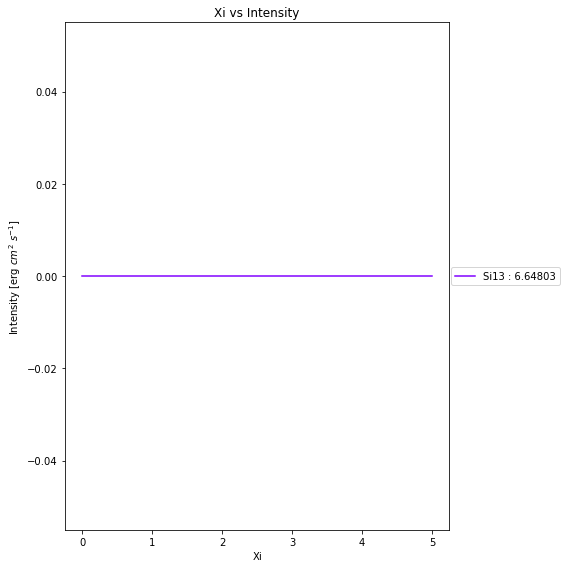

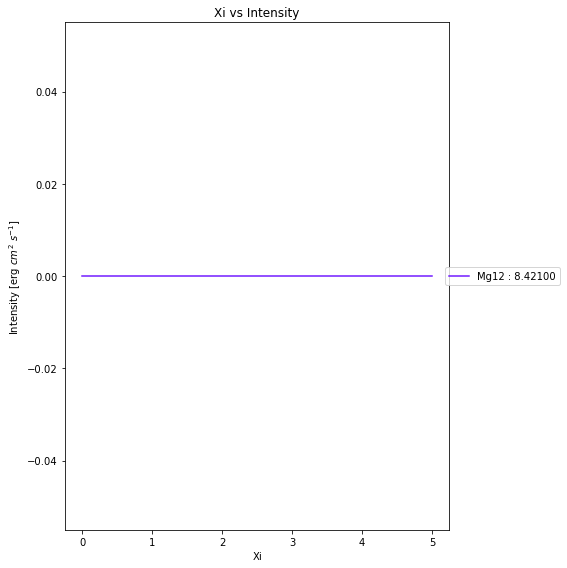

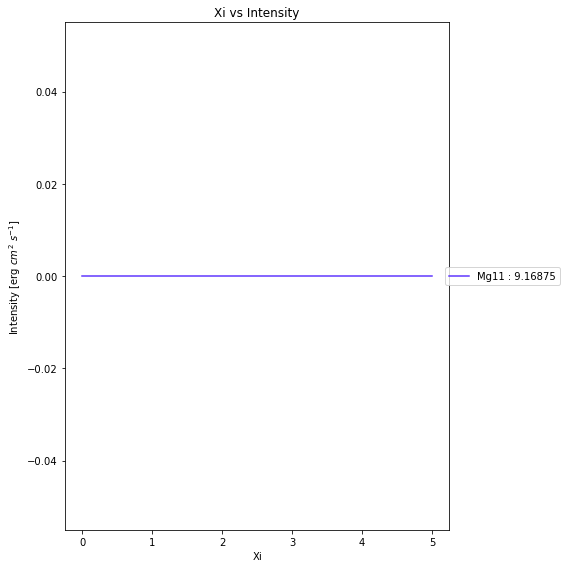

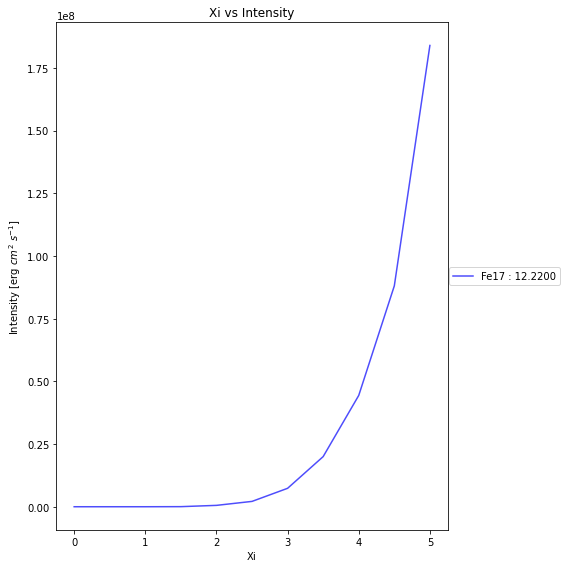

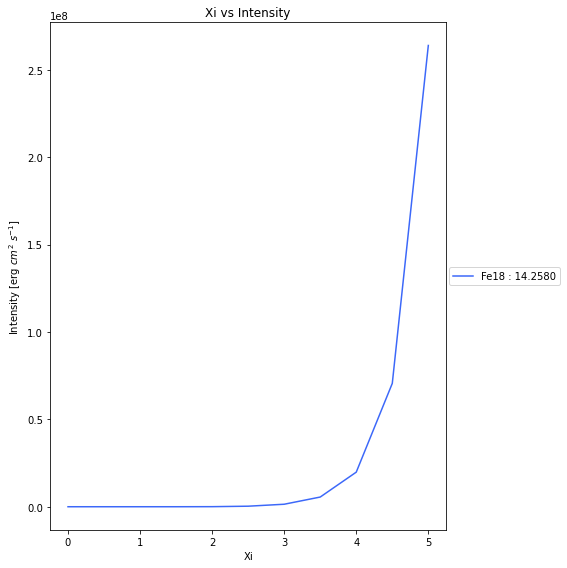

...

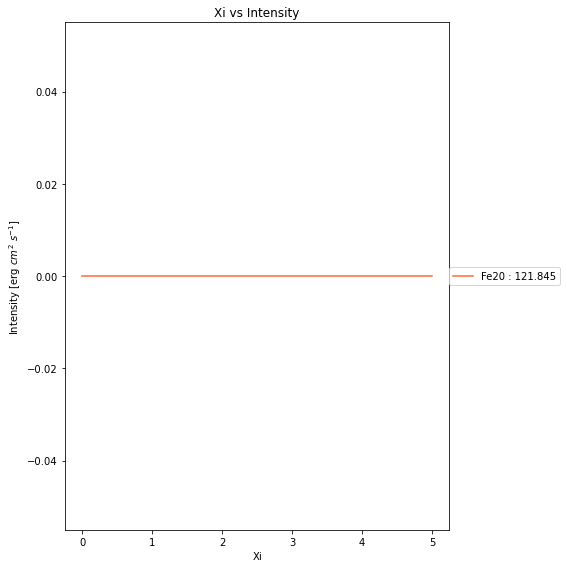

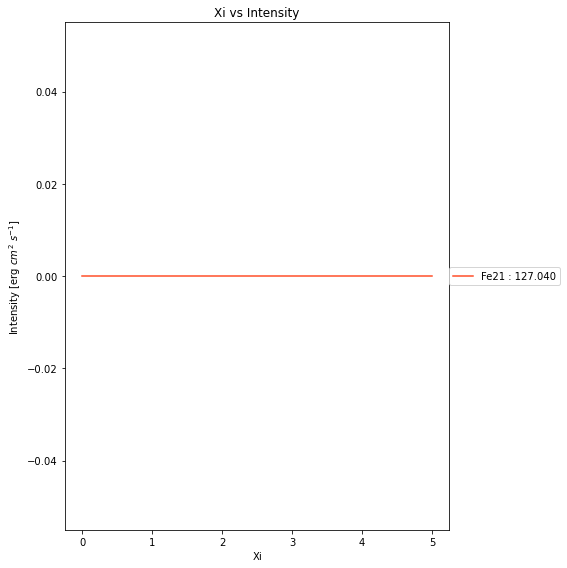

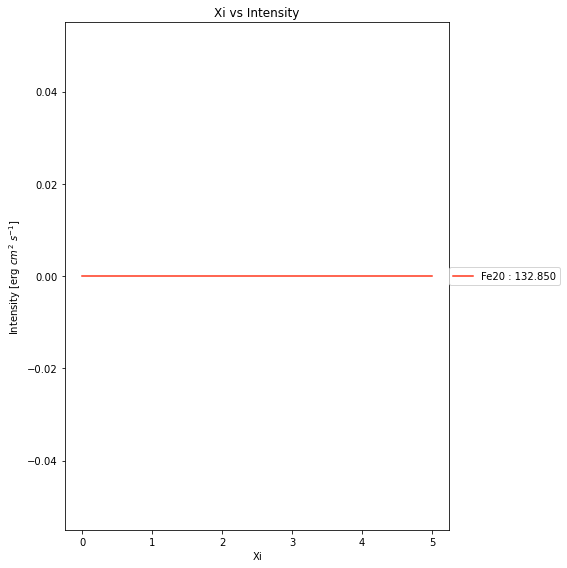

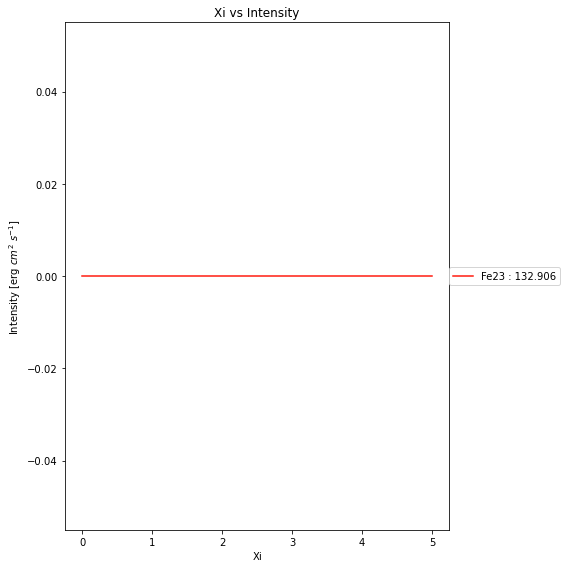

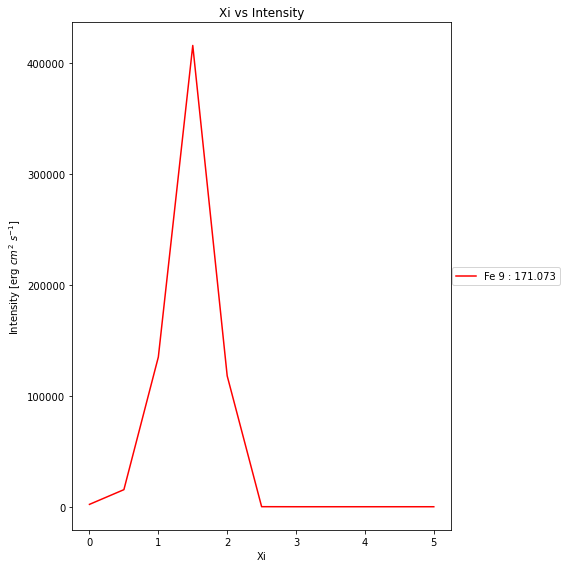

In [9]:
plt.figure(figsize=(8,8))
colors = plt.cm.rainbow(np.linspace(0, 1, len(intensity_temp.columns)))
for i in range(len(intensity_temp.columns)):
    plt.figure(figsize=(8,8))
    plt.plot(Xi, np.array(intensity_temp)[:,i], color=colors[i], ms=0.5, label = str(intensity_temp.columns[i][0:4])
                                                                          +' : '+str(intensity_temp.columns[i][5:-1]))
    plt.xlabel('Xi')
    plt.ylabel('Intensity [erg $cm^2$ $s^{-1}$]')
    plt.legend(loc='center right', bbox_to_anchor=(1.30, 0.5))
    plt.title('Xi vs Intensity')
#    plt.show()
    plt.savefig('Element_Intensities/'+str(intensity_temp.columns[i][0:4]+'.png'), dpi=200)

### Finding the top 5 most intense lines

In [10]:
intensity_array = np.array(intensity_temp)

In [11]:
max_val = np.ones(len(intensity_array[0]))
for i in range(len(intensity_array[0])):
    print(intensity_temp.columns[i][0:4]+':'+ intensity_temp.columns[i][5:-1], 
          ' Maximum Value:', max(intensity_array[:,i]))
    max_val[i] = max(intensity_array[:,i])
    

Si13:6.64803  Maximum Value: 0.0
Mg12:8.42100  Maximum Value: 0.0
Mg11:9.16875  Maximum Value: 0.0
Fe17:12.2200  Maximum Value: 184000000.0
Fe18:14.2580  Maximum Value: 264000000.0
Fe17:15.2620  Maximum Value: 248000000.0
O  8:16.0059  Maximum Value: 22700000.0
Fe18:16.0260  Maximum Value: 237000000.0
Fe17:16.7760  Maximum Value: 158000000.0
Fe17:17.0510  Maximum Value: 185000000.0
O  8:18.9689  Maximum Value: 301000000.0
O  7:21.6020  Maximum Value: 4470000.0
N  7:24.7810  Maximum Value: 40000000.0
N  6:28.7870  Maximum Value: 663000.0
C  6:33.7360  Maximum Value: 46200000.0
C  5:40.2678  Maximum Value: 587000.0
Fe16:50.5650  Maximum Value: 958000.0
Fe16:54.7100  Maximum Value: 145000.0
Fe16:63.7110  Maximum Value: 173000.0
Fe16:66.3570  Maximum Value: 515.0
Fe18:93.9320  Maximum Value: 180000000.0
Fe18:103.948  Maximum Value: 451000000.0
Fe19:108.355  Maximum Value: 6560000.0
Fe22:117.144  Maximum Value: 0.0
Fe20:118.680  Maximum Value: 0.0
Fe19:119.983  Maximum Value: 1660000.0
Fe20

In [203]:
max_ind = [max_val>2.5e+07]
max_ind

[array([False, False, False,  True,  True,  True, False,  True,  True,
         True,  True, False,  True, False,  True, False, False, False,
        False, False,  True,  True, False, False, False, False, False,
        False, False, False, False])]

In [222]:
for i in range(len(max_val[max_ind])):
    print(f"{max_val[max_ind][i]:.2e}", np.array(intensity_temp.columns)[max_ind][i], i)

1.84e+08 Fe17 12.2200A 0
2.64e+08 Fe18 14.2580A 1
2.48e+08 Fe17 15.2620A 2
2.37e+08 Fe18 16.0260A 3
1.58e+08 Fe17 16.7760A 4
1.85e+08 Fe17 17.0510A 5
3.01e+08 O  8 18.9689A 6
4.00e+07 N  7 24.7810A 7
4.62e+07 C  6 33.7360A 8
1.80e+08 Fe18 93.9320A 9
4.51e+08 Fe18 103.948A 10


<ipython-input-222-597d218f229d>:1: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for i in range(len(max_val[max_ind])):
<ipython-input-222-597d218f229d>:2: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  print(f"{max_val[max_ind][i]:.2e}", np.array(intensity_temp.columns)[max_ind][i], i)


# Converting for Veusz & Test Contour Plots 

In [4]:
contour_intensity_temp = pd.read_csv('equiv.csv')
#contour_intensity_temp

In [5]:
contour_intensity = contour_intensity_temp.iloc[: , 1:]
contour_intensity.shape

(273, 33)

In [91]:
edit_contour_intensity = contour_intensity

In [92]:
#This code normalizes the data with respect to the Hydrogen Line
for idc, column_name in enumerate(edit_contour_intensity.columns):
    last_column_name = edit_contour_intensity.columns[-1]
    edit_contour_intensity[column_name] = edit_contour_intensity[column_name]/edit_contour_intensity[last_column_name]

In [93]:
edit_contour_intensity.to_csv('contour_intensity.csv') #Saving the new intensity data set after getting rid of random rows

In [94]:
Xi_and_NH_temp = pd.read_csv('contour_xaxis.csv') #reading in the Xi and N_H values

21

In [106]:
Xi_and_NH_temp

,Xi,Column_den,grid parameter string
0,0.0,21.00,"0.000000, 21.000000"
1,0.0,21.25,"0.000000, 21.250000"
2,0.0,21.50,"0.000000, 21.500000"
3,0.0,21.75,"0.000000, 21.750000"
4,0.0,22.00,"0.000000, 22.000000"
...,...,...,...
268,5.0,23.00,"5.000000, 23.000000"
269,5.0,23.25,"5.000000, 23.250000"
270,5.0,23.50,"5.000000, 23.500000"
271,5.0,23.75,"5.000000, 23.750000"


In [221]:
edit_contour_intensity

,Si13 6.64803A,Mg12 8.42100A,Mg11 9.16875A,Fe17 12.2200A,Fe18 14.2580A,Fe17 15.2620A,O 8 16.0059A,Fe18 16.0260A,Fe17 16.7760A,Fe17 17.0510A,...,Fe19 108.355A,Fe22 117.144A,Fe20 118.680A,Fe19 119.983A,Fe20 121.845A,Fe21 127.040A,Fe20 132.850A,Fe23 132.906A,Fe 9 171.073A,H 1 1215.67A
0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000069,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000483,1.0
1,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000046,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000276,1.0
2,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000024,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000143,1.0
3,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000016,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000095,1.0
4,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000015,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000091,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268,0.0,0.0,0.0,6.579477,7.364185,7.887324,0.438632,7.806841,6.136821,7.122736,...,1.201207,0.0,0.0,0.440644,0.0,0.0,0.0,0.0,0.000000,1.0
269,0.0,0.0,0.0,5.110565,5.208845,5.761671,0.362408,5.896806,4.778870,5.552826,...,1.044226,0.0,0.0,0.464373,0.0,0.0,0.0,0.0,0.000000,1.0
270,0.0,0.0,0.0,4.354839,3.983871,4.540323,0.338710,4.830645,4.241935,4.911290,...,0.806452,0.0,0.0,0.402419,0.0,0.0,0.0,0.0,0.000000,1.0
271,0.0,0.0,0.0,4.022599,3.225989,3.779661,0.347458,4.192090,4.384181,5.039548,...,0.610169,0.0,0.0,0.316949,0.0,0.0,0.0,0.0,0.000000,1.0


In [341]:
Xi_and_NH_temp

,Xi,Column_den,grid parameter string
0,0.0,21.00,"0.000000, 21.000000"
1,0.0,21.25,"0.000000, 21.250000"
2,0.0,21.50,"0.000000, 21.500000"
3,0.0,21.75,"0.000000, 21.750000"
4,0.0,22.00,"0.000000, 22.000000"
...,...,...,...
268,5.0,23.00,"5.000000, 23.000000"
269,5.0,23.25,"5.000000, 23.250000"
270,5.0,23.50,"5.000000, 23.500000"
271,5.0,23.75,"5.000000, 23.750000"


In [340]:
Xi = np.array(Xi_and_NH_temp['Xi'])[0::13]
Xi

array([0.  , 0.25, 0.5 , 0.75, 1.  , 1.25, 1.5 , 1.75, 2.  , 2.25, 2.5 ,
       2.75, 3.  , 3.25, 3.5 , 3.75, 4.  , 4.25, 4.5 , 4.75, 5.  ])

In [350]:
xdata_1 = Xi
ydata_1 = edit_contour_intensity['Fe17 12.2200A'].iloc[:21]

print(len(xdata_1), len(ydata_1))

21 21


In [355]:
np.array(ydata_1)

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0.])

In [366]:
np.copy(ydata_1.to_numpy())

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0.])

In [370]:
yarray = []

for idy in ydata_1.to_numpy():
    yarray.append(idy+1)

In [371]:
plt.plot(yarray, yarray)

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

In [356]:
plt.plot(np.array(ydata_1), np.array(ydata_1))

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

In [348]:
edit_contour_intensity['Fe17 12.2200A'].iloc[:21]

0     0.0
1     0.0
2     0.0
3     0.0
4     0.0
5     0.0
6     0.0
7     0.0
8     0.0
9     0.0
10    0.0
11    0.0
12    0.0
13    0.0
14    0.0
15    0.0
16    0.0
17    0.0
18    0.0
19    0.0
20    0.0
Name: Fe17 12.2200A, dtype: float64

In [ ]:
np.array(edit_contour_intensity)

In [344]:
j=0
np.array(edit_contour_intensity)[:,i][j:j+21]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0.])

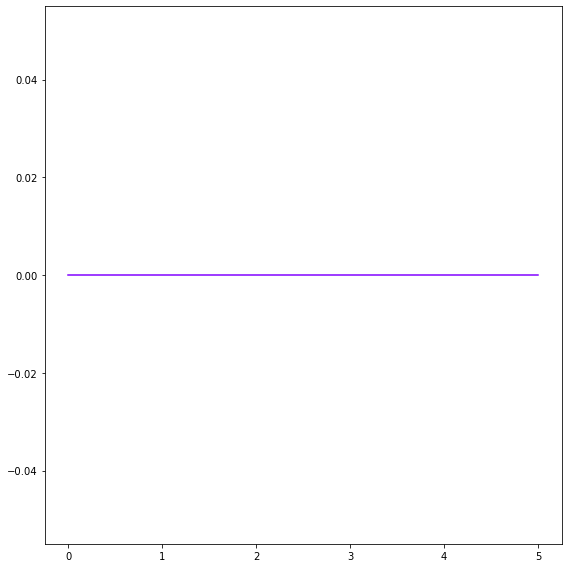

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

ValueError: x and y must have same first dimension, but have shapes (21,) and (0,)

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

In [339]:
plt.figure(figsize=(8,8))
plt.rcParams["figure.figsize"] = [0, 16]
plt.rcParams["figure.autolayout"] = True
colors = plt.cm.rainbow(np.linspace(0, 1, len(edit_contour_intensity.columns)))
j = 0
for i in range(len(np.array(edit_contour_intensity)[0])):
    plt.plot(Xi, np.array(edit_contour_intensity)[:,i][j:j+21], color=colors[i])
    j += 21
    plt.show()
    

# plt.xlabel('Xi', fontsize=18, fontname= 'Times')
# plt.ylabel('Intensity [erg $cm^2$ $s^{-1}$]', fontsize=18, fontname= 'Times')
# plt.legend(loc='center right', bbox_to_anchor=(1.30, 0.5))
# plt.title('Intensity vs Xi', fontsize=18, fontname= 'Times')
# plt.savefig('Intensity_vs_Xi', dpi=200)

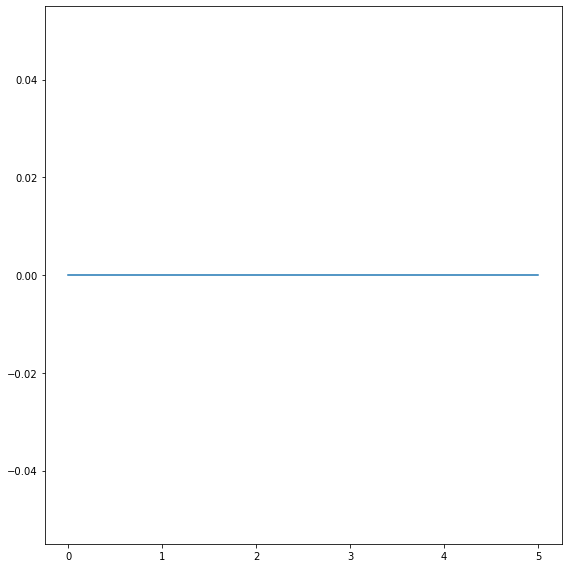

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[6.88787185e-05 4.59249677e-05 2.40939597e-05 1.59555556e-05
 1.54077253e-05 1.53418803e-05 1.53418803e-05 1.53418803e-05
 1.53418803e-05 1.53418803e-05 1.53418803e-05 1.53418803e-05
 1.53418803e-05 2.74752475e-04 1.78623719e-04 1.10256410e-04
 6.28019324e-05 3.93939394e-05 3.85756677e-05 3.84615385e-05
 3.84615385e-05]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[3.08924485e-04 1.95342820e-04 1.02013423e-04 6.75555556e-05
 6.52360515e-05 6.49572650e-05 6.49572650e-05 6.49572650e-05
 6.49572650e-05 6.49572650e-05 6.49572650e-05 6.49572650e-05
 6.49572650e-05 1.21534653e-03 9.19472914e-04 6.47863248e-04
 3.80193237e-04 2.38484848e-04 2.33531157e-04 2.32840237e-04
 2.32840237e-04]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00297483 0.00195343 0.00103356 0.00068444 0.00066094 0.00065812
 0.00065812 0.00065812 0.00065812 0.00065812 0.00065812 0.00065812
 0.00065812 0.01009901 0.00775988 0.00529915 0.00307246 0.00192727
 0.00188724 0.00188166 0.00188166]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00054005 0.00035576 0.00019195 0.00012711 0.00012275 0.00012222
 0.00012222 0.00012222 0.00012222 0.00012222 0.00012222 0.00012222
 0.00012222 0.00183416 0.00145827 0.00109402 0.00067633 0.00042424
 0.00041543 0.0004142  0.0004142 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.0024714  0.00173351 0.00095973 0.00063556 0.00061373 0.00061111
 0.00061111 0.00061111 0.00061111 0.00061111 0.00061111 0.00061111
 0.00061111 0.00591584 0.0047877  0.00360684 0.00224155 0.00140909
 0.00137982 0.00137574 0.00137574]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00398169 0.0030401  0.00175839 0.00116444 0.00112446 0.00111966
 0.00111966 0.00111966 0.00111966 0.00111966 0.00111966 0.00111966
 0.00111966 0.01277228 0.01101025 0.00863248 0.00555556 0.00348485
 0.00341246 0.00340237 0.00340237]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.0071167  0.00504528 0.00286577 0.00190222 0.00183691 0.00182906
 0.00182906 0.00182906 0.00182906 0.00182906 0.00182906 0.00182906
 0.00182906 0.01366337 0.01098097 0.00809402 0.00512077 0.00324242
 0.00317507 0.00316568 0.00316568]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 4.57920792e-10 3.79209370e-10 2.64957265e-10
 1.52173913e-10 9.54545455e-11 9.34718101e-11 9.31952663e-11
 9.31952663e-11]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[4.82837529e-04 2.75549806e-04 1.42953020e-04 9.46666667e-05
 9.14163090e-05 9.10256410e-05 9.10256410e-05 9.10256410e-05
 9.10256410e-05 9.10256410e-05 9.10256410e-05 9.10256410e-05
 9.10256410e-05 1.40841584e-03 8.85797950e-04 5.24786325e-04
 2.96618357e-04 1.86060606e-04 1.82195846e-04 1.81656805e-04
 1.81656805e-04]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


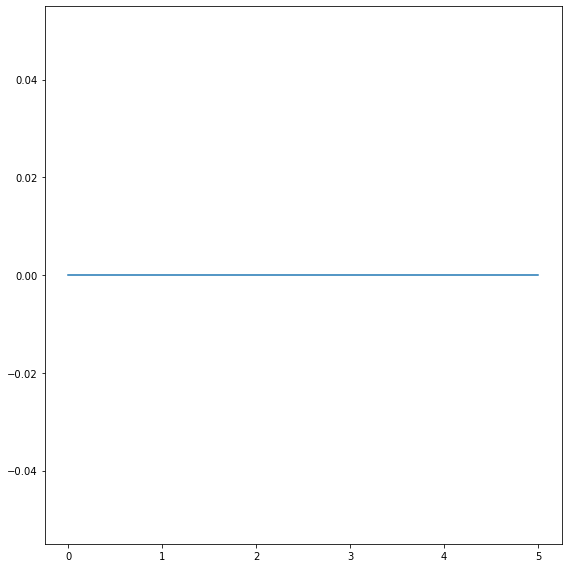

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[3.84615385e-05 3.84615385e-05 3.84615385e-05 3.84615385e-05
 3.84615385e-05 7.02917772e-04 4.51200000e-04 2.81730769e-04
 1.71428571e-04 1.00000000e-04 6.13034623e-05 6.06854839e-05
 6.05633803e-05 6.04417671e-05 6.04417671e-05 6.04417671e-05
 6.04417671e-05 6.04417671e-05 1.73731343e-03 1.11313869e-03
 7.08988764e-04]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00023284 0.00023284 0.00023284 0.00023284 0.00023284 0.00440318
 0.003664   0.00293269 0.00214857 0.0013289  0.00081466 0.00080645
 0.00080483 0.00080321 0.00080321 0.00080321 0.00080321 0.00080321
 0.01570149 0.01359489 0.01146067]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00188166 0.00188166 0.00188166 0.00188166 0.00188166 0.02679045
 0.02208    0.01721154 0.01205714 0.00730897 0.00448065 0.00443548
 0.00442656 0.00441767 0.00441767 0.00441767 0.00441767 0.00441767
 0.06059701 0.05255474 0.04359551]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.0004142  0.0004142  0.0004142  0.0004142  0.0004142  0.00567639
 0.00488    0.00409615 0.00318857 0.00206977 0.00127088 0.00125806
 0.00125553 0.00125301 0.00125301 0.00125301 0.00125301 0.00125301
 0.01650746 0.01481752 0.01314607]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00137574 0.00137574 0.00137574 0.00137574 0.00137574 0.01159151
 0.009808   0.00802885 0.00611429 0.00401993 0.00248473 0.00245968
 0.00245473 0.0024498  0.0024498  0.0024498  0.0024498  0.0024498
 0.02050746 0.01779197 0.01539326]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00340237 0.00340237 0.00340237 0.00340237 0.00340237 0.03262599
 0.02896    0.02423077 0.01834286 0.01196013 0.00735234 0.00727823
 0.00726358 0.007249   0.007249   0.007249   0.007249   0.007249
 0.07134328 0.06514599 0.05707865]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00316568 0.00316568 0.00316568 0.00316568 0.00316568 0.0206366
 0.0176     0.01432692 0.01085714 0.00727575 0.00448065 0.00443548
 0.00442656 0.00441767 0.00441767 0.00441767 0.00441767 0.00441767
 0.02722388 0.02427007 0.02146067]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[9.31952663e-11 9.31952663e-11 9.31952663e-11 9.31952663e-11
 9.31952663e-11 2.02122016e-08 1.82400000e-08 1.43269231e-08
 9.54285714e-09 5.61461794e-09 3.44195519e-09 3.40725806e-09
 3.40040241e-09 3.39357430e-09 3.39357430e-09 3.39357430e-09
 3.39357430e-09 3.39357430e-09 8.02985075e-07 7.95620438e-07
 7.21348315e-07]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00018166 0.00018166 0.00018166 0.00018166 0.00018166 0.00355438
 0.002336   0.00146154 0.00088    0.00051163 0.00031365 0.00031048
 0.00030986 0.00030924 0.00030924 0.00030924 0.00030924 0.00030924
 0.01029851 0.00728102 0.00498876]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


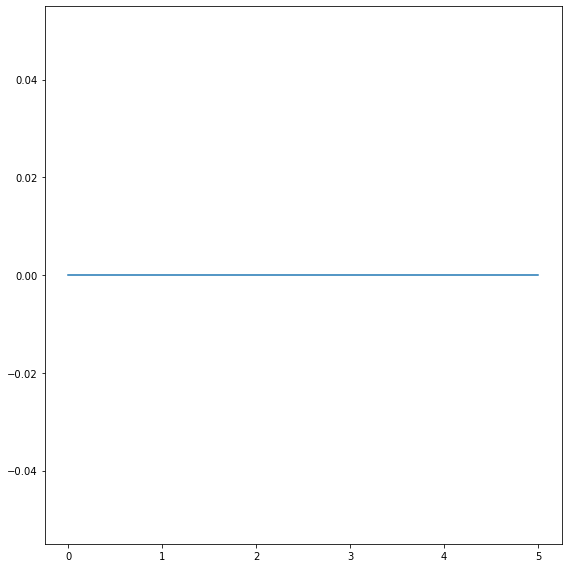

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 5.71428571e-07 5.26548673e-07
 4.28969359e-07 2.95614035e-07 1.82258065e-07 1.07324841e-07
 5.98579041e-08 2.76229508e-08 2.76229508e-08 2.76229508e-08
 2.76229508e-08]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 8.57142857e-07 7.85398230e-07
 6.35097493e-07 4.35964912e-07 2.67741935e-07 1.57961783e-07
 8.80994671e-08 4.06557377e-08 4.06557377e-08 4.06557377e-08
 4.06557377e-08]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[4.45517241e-04 2.72083333e-04 1.55819477e-04 8.73501997e-05
 8.67724868e-05 8.66578600e-05 8.66578600e-05 8.65435356e-05
 8.65435356e-05 8.66578600e-05 4.53571429e-03 2.94247788e-03
 1.90807799e-03 1.22807018e-03 7.63440860e-04 4.55414013e-04
 2.53996448e-04 1.17213115e-04 1.17213115e-04 1.17213115e-04
 1.17213115e-04]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 1.76071429e-07 1.51991150e-07
 1.14206128e-07 7.40350877e-08 4.51075269e-08 2.67197452e-08
 1.49023091e-08 6.87704918e-09 6.87704918e-09 6.87704918e-09
 6.87704918e-09]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 2.52857143e-07 2.34513274e-07
 1.93593315e-07 1.35087719e-07 8.38709677e-08 4.93630573e-08
 2.75310835e-08 1.27049180e-08 1.27049180e-08 1.27049180e-08
 1.27049180e-08]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00889655 0.00616667 0.00368171 0.00206391 0.00205026 0.00204756
 0.00204756 0.00204485 0.00204485 0.00204756 0.055      0.04889381
 0.04220056 0.03377193 0.02408602 0.01519108 0.00856128 0.00395902
 0.00395902 0.00395902 0.00395902]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.03372414 0.02354167 0.01408551 0.00789614 0.00784392 0.00783355
 0.00783355 0.00782322 0.00782322 0.00783355 0.12392857 0.11106195
 0.09763231 0.08149123 0.06129032 0.04044586 0.02309059 0.0107377
 0.0107377  0.0107377  0.0107377 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.01110345 0.00833333 0.0052019  0.00291611 0.00289683 0.002893
 0.002893   0.00288918 0.00288918 0.002893   0.04357143 0.04026549
 0.03732591 0.03324561 0.0266129  0.01840764 0.01076377 0.00498361
 0.00498361 0.00498361 0.00498361]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.01275862 0.00979167 0.00638955 0.00360852 0.00358466 0.00357992
 0.00357992 0.0035752  0.0035752  0.00357992 0.03275    0.02853982
 0.02562674 0.02298246 0.01930108 0.01455414 0.00914742 0.0042623
 0.0042623  0.0042623  0.0042623 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.04668966 0.03445833 0.02159145 0.01214381 0.01206349 0.01204756
 0.01204756 0.01203166 0.01203166 0.01204756 0.13392857 0.12588496
 0.11699164 0.10350877 0.0827957  0.05859873 0.0348135  0.01614754
 0.01614754 0.01614754 0.01614754]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.01827586 0.01441667 0.00971496 0.00549933 0.00546296 0.00545575
 0.00545575 0.00544855 0.00544855 0.00545575 0.032      0.02787611
 0.02562674 0.02394737 0.02155914 0.01773885 0.01190053 0.00559016
 0.00559016 0.00559016 0.00559016]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[5.59310345e-07 3.60833333e-07 2.05938242e-07 1.15446072e-07
 1.14682540e-07 1.14531044e-07 1.14531044e-07 1.14379947e-07
 1.14379947e-07 1.14531044e-07 2.52142857e-05 2.69911504e-05
 2.74373259e-05 2.46491228e-05 1.81720430e-05 1.11146497e-05
 6.19893428e-06 2.86065574e-06 2.86065574e-06 2.86065574e-06
 2.86065574e-06]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 8.82142857e-07 8.45132743e-07
 7.35376045e-07 5.46491228e-07 3.51075269e-07 2.07324841e-07
 1.15452931e-07 5.32786885e-08 5.32786885e-08 5.32786885e-08
 5.32786885e-08]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 6.39285714e-08 6.01769912e-08
 5.11142061e-08 3.69298246e-08 2.33333333e-08 1.37898089e-08
 7.69094139e-09 3.54918033e-09 3.54918033e-09 3.54918033e-09
 3.54918033e-09]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 7.82142857e-08 7.38938053e-08
 6.29526462e-08 4.57017544e-08 2.89784946e-08 1.71019108e-08
 9.53818828e-09 4.40163934e-09 4.40163934e-09 4.40163934e-09
 4.40163934e-09]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 1.82857143e-10 1.73672566e-10
 1.49025070e-10 1.08771930e-10 6.93548387e-11 4.10828025e-11
 2.27353464e-11 1.04918033e-11 1.04918033e-11 1.04918033e-11
 1.04918033e-11]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00325517 0.00200417 0.00114252 0.00064048 0.00063624 0.0006354
 0.0006354  0.00063456 0.00063456 0.0006354  0.02478571 0.01876106
 0.01406685 0.01017544 0.00688172 0.00429936 0.00241563 0.00111475
 0.00111475 0.00111475 0.00111475]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


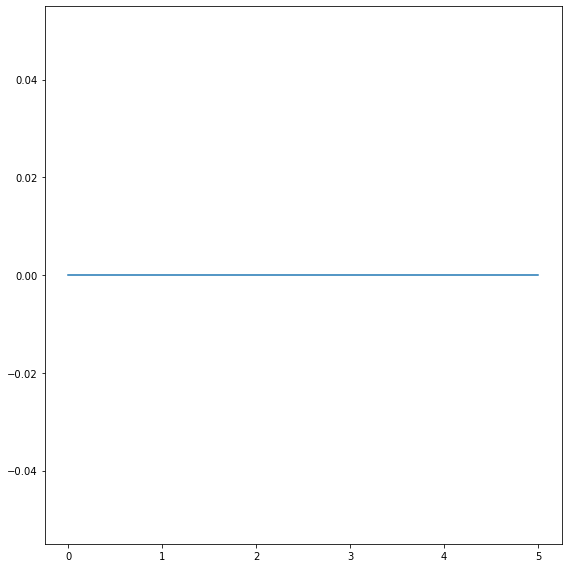

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[2.76229508e-08 2.76229508e-08 2.09677419e-04 1.98866856e-04
 1.73262032e-04 1.28959276e-04 8.08510638e-05 4.78813559e-05
 2.67772512e-05 1.42138365e-05 6.17486339e-06 5.51219512e-06
 5.51219512e-06 5.51219512e-06 5.51219512e-06 1.37735849e-02
 9.88847584e-03 6.93693694e-03 4.71988796e-03 3.03508772e-03
 1.84324324e-03]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00000000e+00 0.00000000e+00 7.32718894e-08 6.82719547e-08
 5.79322638e-08 4.12895928e-08 2.52482270e-08 1.47457627e-08
 8.24644550e-09 4.37735849e-09 1.90163934e-09 1.69756098e-09
 1.69756098e-09 1.69756098e-09 1.69756098e-09 2.12578616e-05
 1.94052045e-05 1.64864865e-05 1.24509804e-05 7.99122807e-06
 4.65945946e-06]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[4.06557377e-08 4.06557377e-08 3.17050691e-04 3.00283286e-04
 2.62032086e-04 1.92307692e-04 1.21276596e-04 7.20338983e-05
 4.02843602e-05 2.13836478e-05 9.28961749e-06 8.29268293e-06
 8.29268293e-06 8.29268293e-06 8.29268293e-06 1.86163522e-02
 1.31226766e-02 9.03153153e-03 6.09243697e-03 3.92105263e-03
 2.38918919e-03]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00011721 0.00011721 0.01308756 0.00835694 0.00543672 0.00352941
 0.00225532 0.00135593 0.00076066 0.00040377 0.00017541 0.00015659
 0.00015659 0.00015659 0.00015659 0.03773585 0.02315985 0.0145045
 0.00927171 0.00592982 0.00370811]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00000000e+00 0.00000000e+00 2.06451613e-08 1.91784703e-08
 1.62032086e-08 1.15384615e-08 6.99290780e-09 4.09745763e-09
 2.29146919e-09 1.21635220e-09 5.28415301e-10 4.71707317e-10
 4.71707317e-10 4.71707317e-10 4.71707317e-10 6.05660377e-06
 5.53903346e-06 4.72972973e-06 3.55742297e-06 2.24561404e-06
 1.30270270e-06]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[6.87704918e-09 6.87704918e-09 6.77419355e-05 6.20396601e-05
 5.11586453e-05 3.58597285e-05 2.20567376e-05 1.30508475e-05
 7.29857820e-06 3.87421384e-06 1.68306011e-06 1.50243902e-06
 1.50243902e-06 1.50243902e-06 1.50243902e-06 7.48427673e-03
 6.13382900e-03 4.61711712e-03 3.20728291e-03 2.05263158e-03
 1.23783784e-03]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.27049180e-08 1.27049180e-08 9.30875576e-05 8.95184136e-05
 7.95008913e-05 6.04072398e-05 3.87943262e-05 2.30084746e-05
 1.28436019e-05 6.81761006e-06 2.96174863e-06 2.64390244e-06
 2.64390244e-06 2.64390244e-06 2.64390244e-06 9.62264151e-03
 7.80669145e-03 5.90090090e-03 4.17366947e-03 2.72807018e-03
 1.66486486e-03]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00395902 0.00395902 0.19585253 0.18101983 0.16541889 0.14253394
 0.10851064 0.06991525 0.03957346 0.02113208 0.00918033 0.00819512
 0.00819512 0.00819512 0.00819512 0.57610063 0.52788104 0.48648649
 0.44117647 0.37280702 0.27459459]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.0107377  0.0107377  0.22442396 0.20169972 0.18181818 0.16176471
 0.13404255 0.09745763 0.05876777 0.03144654 0.0136612  0.01219512
 0.01219512 0.01219512 0.01219512 0.36415094 0.31152416 0.27252252
 0.24369748 0.21491228 0.17945946]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00498361 0.00498361 0.10230415 0.09291785 0.08734403 0.08122172
 0.07085106 0.05338983 0.03317536 0.01798742 0.00781421 0.00697561
 0.00697561 0.00697561 0.00697561 0.21320755 0.18289963 0.16441441
 0.15266106 0.14035088 0.12      ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.0042623  0.0042623  0.05023041 0.04107649 0.03565062 0.03246606
 0.02985816 0.02584746 0.01886256 0.01091824 0.00476503 0.00425366
 0.00425366 0.00425366 0.00425366 0.08427673 0.06171004 0.04797297
 0.03963585 0.03491228 0.03243243]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.01614754 0.01614754 0.22165899 0.20849858 0.19964349 0.18778281
 0.16737589 0.13177966 0.08672986 0.04767296 0.02076503 0.01853659
 0.01853659 0.01853659 0.01853659 0.35849057 0.31747212 0.29279279
 0.27871148 0.26140351 0.23297297]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00559016 0.00559016 0.04142857 0.03286119 0.02745098 0.02454751
 0.02312057 0.02216102 0.01921801 0.01221384 0.00534973 0.00477561
 0.00477561 0.00477561 0.00477561 0.0618239  0.0464684  0.03513514
 0.02773109 0.02307018 0.02064865]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[2.86065574e-06 2.86065574e-06 4.97695853e-04 5.32577904e-04
 5.32976827e-04 4.68325792e-04 3.56028369e-04 2.29661017e-04
 1.29620853e-04 6.88050314e-05 2.98907104e-05 2.66829268e-05
 2.66829268e-05 2.66829268e-05 2.66829268e-05 3.85534591e-03
 3.45353160e-03 2.86036036e-03 2.26890756e-03 1.70175439e-03
 1.18378378e-03]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[5.32786885e-08 5.32786885e-08 1.36405530e-04 1.33711048e-04
 1.23529412e-04 1.00339367e-04 6.89361702e-05 4.16949153e-05
 2.32701422e-05 1.23522013e-05 5.36612022e-06 4.79024390e-06
 4.79024390e-06 4.79024390e-06 4.79024390e-06 5.88679245e-03
 4.72118959e-03 3.53603604e-03 2.47899160e-03 1.63157895e-03
 1.02162162e-03]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[3.54918033e-09 3.54918033e-09 1.00921659e-05 9.91501416e-06
 9.14438503e-06 7.33031674e-06 4.89361702e-06 2.91949153e-06
 1.63033175e-06 8.65408805e-07 3.75956284e-07 3.35609756e-07
 3.35609756e-07 3.35609756e-07 3.35609756e-07 5.96226415e-04
 5.68773234e-04 5.13513514e-04 4.25770308e-04 3.07894737e-04
 1.94594595e-04]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[4.40163934e-09 4.40163934e-09 1.23963134e-05 1.22096317e-05
 1.12834225e-05 9.07239819e-06 6.09929078e-06 3.65254237e-06
 2.04028436e-06 1.08301887e-06 4.70491803e-07 4.20000000e-07
 4.20000000e-07 4.20000000e-07 4.20000000e-07 7.42138365e-04
 6.98884758e-04 6.26126126e-04 5.16806723e-04 3.75438596e-04
 2.37837838e-04]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.04918033e-11 1.04918033e-11 2.85253456e-08 2.79036827e-08
 2.56684492e-08 2.07013575e-08 1.39716312e-08 8.38983051e-09
 4.66824645e-09 2.47798742e-09 1.07650273e-09 9.60975610e-10
 9.60975610e-10 9.60975610e-10 9.60975610e-10 1.68553459e-06
 1.61338290e-06 1.48873874e-06 1.27731092e-06 9.64912281e-07
 6.16216216e-07]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00000000e+00 0.00000000e+00 6.26728111e-07 5.94900850e-07
 5.22281640e-07 3.88009050e-07 2.41843972e-07 1.40677966e-07
 7.86729858e-08 4.17610063e-08 1.81420765e-08 1.61951220e-08
 1.61951220e-08 1.61951220e-08 1.61951220e-08 1.79245283e-04
 1.66171004e-04 1.44819820e-04 1.14145658e-04 7.68421053e-05
 4.55675676e-05]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00000000e+00 0.00000000e+00 2.06912442e-07 1.96883853e-07
 1.72549020e-07 1.27828054e-07 8.01418440e-08 4.66101695e-08
 2.60663507e-08 1.38364780e-08 6.01092896e-09 5.36585366e-09
 5.36585366e-09 5.36585366e-09 5.36585366e-09 5.99371069e-05
 5.57620818e-05 4.90990991e-05 3.89355742e-05 2.62280702e-05
 1.54594595e-05]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00111475 0.00111475 0.04746544 0.03711048 0.02905526 0.02273756
 0.01716312 0.01207627 0.00760664 0.0041761  0.00181421 0.00161951
 0.00161951 0.00161951 0.00161951 0.06918239 0.05204461 0.04054054
 0.03277311 0.02666667 0.02135135]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


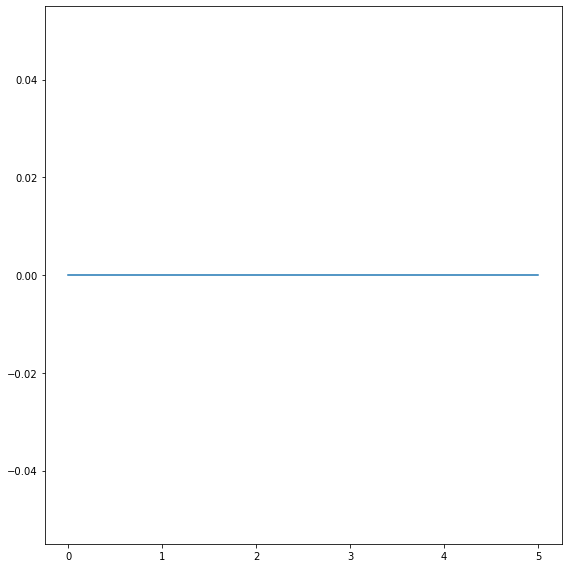

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.06269592e-03 5.59405941e-04 2.80165289e-04 1.17708333e-04
 9.97058824e-05 9.97058824e-05 9.97058824e-05 7.45528455e-02
 5.35545024e-02 3.81615599e-02 2.70450751e-02 1.85714286e-02
 1.20754717e-02 7.36641221e-03 4.09871245e-03 2.06040992e-03
 9.84536082e-04 4.16122004e-04 3.49177331e-04 3.49177331e-04
 2.05410822e-01]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[2.68338558e-06 1.41254125e-06 7.07438017e-07 2.97222222e-07
 2.51764706e-07 2.51764706e-07 2.51764706e-07 7.47967480e-04
 7.15639810e-04 6.51810585e-04 5.55926544e-04 4.23469388e-04
 2.74842767e-04 1.62595420e-04 9.05579399e-05 4.55231931e-05
 2.17525773e-05 9.19389978e-06 7.71480804e-06 7.71480804e-06
 5.19038076e-03]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.37931034e-03 7.26072607e-04 3.63636364e-04 1.52777778e-04
 1.29411765e-04 1.29411765e-04 1.29411765e-04 9.02439024e-02
 6.25592417e-02 4.31754875e-02 2.95492487e-02 1.98979592e-02
 1.28301887e-02 7.82442748e-03 4.37768240e-03 2.20064725e-03
 1.05154639e-03 4.44444444e-04 3.72943327e-04 3.72943327e-04
 2.41482966e-01]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00215987 0.00113861 0.00057025 0.00023958 0.00020294 0.00020294
 0.00020294 0.09186992 0.05592417 0.03398329 0.02103506 0.01316327
 0.00830189 0.00507634 0.00287554 0.00144552 0.00069072 0.00029194
 0.00024497 0.00024497 0.20140281]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[7.49216301e-07 3.94389439e-07 1.97520661e-07 8.29861111e-08
 7.02941176e-08 7.02941176e-08 7.02941176e-08 2.16260163e-04
 2.09952607e-04 1.96378830e-04 1.73622705e-04 1.36734694e-04
 8.86792453e-05 5.19083969e-05 2.87553648e-05 1.44552319e-05
 6.90721649e-06 2.91938998e-06 2.44972578e-06 2.44972578e-06
 1.54308617e-03]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[7.14733542e-04 3.76237624e-04 1.88429752e-04 7.91666667e-05
 6.70588235e-05 6.70588235e-05 6.70588235e-05 5.64227642e-02
 4.00473934e-02 2.84122563e-02 2.02003339e-02 1.41836735e-02
 9.43396226e-03 5.76335878e-03 3.19742489e-03 1.60733549e-03
 7.68041237e-04 3.24618736e-04 2.72394881e-04 2.72394881e-04
 1.56312625e-01]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[9.59247649e-04 5.04950495e-04 2.52892562e-04 1.06250000e-04
 9.00000000e-05 9.00000000e-05 9.00000000e-05 6.84552846e-02
 4.97630332e-02 3.59331476e-02 2.63772955e-02 1.90816327e-02
 1.28930818e-02 7.90076336e-03 4.37768240e-03 2.20064725e-03
 1.05154639e-03 4.44444444e-04 3.72943327e-04 3.72943327e-04
 1.92384770e-01]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.16708464 0.08811881 0.04413223 0.01854167 0.01570588 0.01570588
 0.01570588 1.30894309 1.19905213 1.11142061 1.02671119 0.92244898
 0.7672956  0.54961832 0.31974249 0.16073355 0.07680412 0.03246187
 0.02723949 0.02723949 2.44488978]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.12758621 0.07046205 0.0353719  0.01486111 0.01258824 0.01258824
 0.01258824 0.53658537 0.43981043 0.37047354 0.31886477 0.27959184
 0.24465409 0.20725191 0.14635193 0.07540453 0.03603093 0.01522876
 0.01277879 0.01277879 0.74348697]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.0862069  0.04884488 0.02454545 0.01034722 0.00876471 0.00876471
 0.00876471 0.39186992 0.32132701 0.27493036 0.24540902 0.2244898
 0.20314465 0.17137405 0.11802575 0.06213592 0.02969072 0.01254902
 0.01053016 0.01053016 0.67134269]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.02940439 0.02079208 0.01090909 0.00458333 0.00388235 0.00388235
 0.00388235 0.1300813  0.09620853 0.06991643 0.05225376 0.04091837
 0.03440252 0.03156489 0.03025751 0.02049622 0.00989691 0.00418301
 0.00351005 0.00351005 0.1503006 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.18087774 0.11039604 0.05603306 0.02354167 0.01994118 0.01994118
 0.01994118 0.57317073 0.48341232 0.42339833 0.38397329 0.35816327
 0.3327044  0.29427481 0.22317597 0.12729234 0.06134021 0.02592593
 0.02175503 0.02175503 0.90480962]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.02037618 0.01881188 0.0107438  0.00451389 0.00382353 0.00382353
 0.00382353 0.06853659 0.05924171 0.04735376 0.03639399 0.02795918
 0.02201258 0.01854962 0.01824034 0.01790723 0.00907216 0.00383442
 0.00321755 0.00321755 0.05300601]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[7.24137931e-04 3.82838284e-04 1.91735537e-04 8.05555556e-05
 6.82352941e-05 6.82352941e-05 6.82352941e-05 1.26016260e-02
 1.05213270e-02 8.18941504e-03 6.16026711e-03 4.57142857e-03
 3.34591195e-03 2.35877863e-03 1.44206009e-03 7.30312837e-04
 3.48969072e-04 1.47494553e-04 1.23765996e-04 1.23765996e-04
 2.64529058e-02]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[5.95611285e-04 3.13531353e-04 1.57024793e-04 6.59722222e-05
 5.58823529e-05 5.58823529e-05 5.58823529e-05 2.80487805e-02
 1.84360190e-02 1.15877437e-02 7.19532554e-03 4.47959184e-03
 2.78616352e-03 1.69847328e-03 9.54935622e-04 4.80043150e-04
 2.29381443e-04 9.69498911e-05 8.13528336e-05 8.13528336e-05
 6.15230461e-02]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.12225705e-04 5.90759076e-05 2.95867769e-05 1.24305556e-05
 1.05294118e-05 1.05294118e-05 1.05294118e-05 5.34146341e-03
 4.78672986e-03 3.95543175e-03 3.07178631e-03 2.27551020e-03
 1.59748428e-03 1.02290076e-03 5.75107296e-04 2.89104639e-04
 1.38144330e-04 5.83877996e-05 4.89945155e-05 4.89945155e-05
 1.09218437e-02]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.37304075e-04 7.21122112e-05 3.61157025e-05 1.51736111e-05
 1.28529412e-05 1.28529412e-05 1.28529412e-05 6.43089431e-03
 5.78199052e-03 4.84679666e-03 3.77295492e-03 2.76530612e-03
 1.91194969e-03 1.21374046e-03 6.82403433e-04 3.43042071e-04
 1.63917526e-04 6.92810458e-05 5.81352834e-05 5.81352834e-05
 1.31262525e-02]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[3.57366771e-07 1.86468647e-07 9.33884298e-08 3.92361111e-08
 3.32352941e-08 3.32352941e-08 3.32352941e-08 1.59349593e-05
 1.55924171e-05 1.45682451e-05 1.26043406e-05 9.85714286e-06
 6.98113208e-06 4.46564885e-06 2.51072961e-06 1.26213592e-06
 6.03092784e-07 2.54901961e-07 2.13893967e-07 2.13893967e-07
 3.22645291e-05]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[2.61442006e-05 1.37458746e-05 6.88429752e-06 2.89236111e-06
 2.45000000e-06 2.45000000e-06 2.45000000e-06 5.65040650e-03
 5.07109005e-03 4.28969359e-03 3.35559265e-03 2.41836735e-03
 1.59119497e-03 9.69465649e-04 5.40772532e-04 2.71844660e-04
 1.29896907e-04 5.49019608e-05 4.60694698e-05 4.60694698e-05
 3.13627255e-02]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[8.87147335e-06 4.66996700e-06 2.33884298e-06 9.82638889e-07
 8.32352941e-07 8.32352941e-07 8.32352941e-07 2.21138211e-03
 2.19431280e-03 2.10027855e-03 1.88647746e-03 1.52040816e-03
 1.05031447e-03 6.33587786e-04 3.47639485e-04 1.74757282e-04
 8.35051546e-05 3.52941176e-05 2.96160878e-05 2.96160878e-05
 1.60320641e-02]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.01617555 0.0110396  0.00609917 0.0025625  0.00217059 0.00217059
 0.00217059 0.06284553 0.04383886 0.03119777 0.02337229 0.01867347
 0.01553459 0.0140458  0.01315451 0.01186624 0.00721649 0.0030719
 0.0025777  0.0025777  0.0090982 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


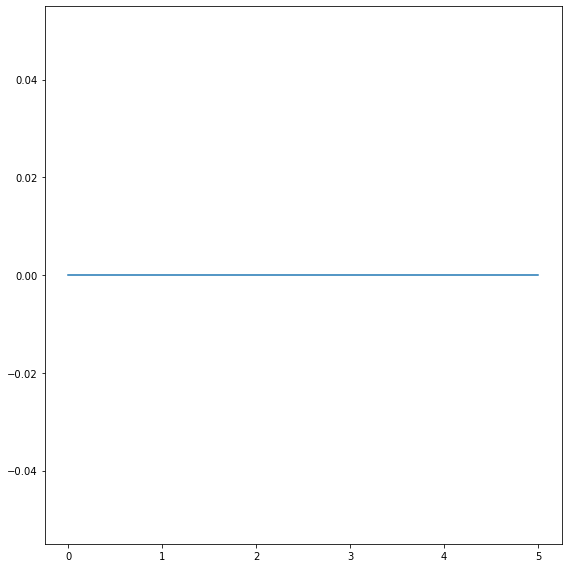

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.15117647 0.10921502 0.0784     0.05527877 0.03807143 0.02517241
 0.01548969 0.00846045 0.00410274 0.00190764 0.00081055 0.0007148
 0.44847775 0.34184397 0.25485232 0.18399015 0.12945402 0.08823529
 0.05841584 0.0371345  0.02210884]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[5.12941176e-03 4.81228669e-03 4.32000000e-03 3.58244365e-03
 2.70000000e-03 1.81465517e-03 1.10051546e-03 6.00282486e-04
 2.91095890e-04 1.35350318e-04 5.75101488e-05 5.07159905e-05
 2.23653396e-02 2.24822695e-02 2.11814346e-02 1.82512315e-02
 1.42528736e-02 1.00840336e-02 6.68316832e-03 4.18128655e-03
 2.46598639e-03]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.17       0.11706485 0.0796     0.05326216 0.03514286 0.02258621
 0.01381443 0.0075565  0.00366438 0.00170382 0.00072395 0.00063842
 0.53629977 0.39148936 0.27890295 0.19137931 0.12787356 0.08327731
 0.0529703  0.03304094 0.01972789]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.24117647e-01 7.47440273e-02 4.54000000e-02 2.77580071e-02
 1.71428571e-02 1.05603448e-02 6.39175258e-03 3.51694915e-03
 1.70547945e-03 7.92993631e-04 3.36941813e-04 2.97136038e-04
 4.19203747e-01 2.67375887e-01 1.65822785e-01 1.00738916e-01
 6.07758621e-02 3.66386555e-02 2.22277228e-02 1.34210526e-02
 7.90816327e-03]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.58235294e-03 1.56655290e-03 1.51400000e-03 1.39976275e-03
 1.18571429e-03 8.75000000e-04 5.36082474e-04 2.90960452e-04
 1.41095890e-04 6.56050955e-05 2.78755074e-05 2.45823389e-05
 6.90866511e-03 7.37588652e-03 7.55274262e-03 7.41379310e-03
 6.83908046e-03 5.74789916e-03 4.32673267e-03 2.88596491e-03
 1.71768707e-03]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.11529412 0.08634812 0.0668     0.05266904 0.04142857 0.03086207
 0.01953608 0.01056497 0.00512329 0.00238217 0.00101218 0.0008926
 0.3501171  0.26808511 0.20843882 0.16551724 0.13433908 0.1092437
 0.08762376 0.06608187 0.04319728]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.14588235 0.11194539 0.0884     0.07081851 0.05635714 0.0424569
 0.02731959 0.01483051 0.00719178 0.00334395 0.00142084 0.00125298
 0.43091335 0.33900709 0.27130802 0.21945813 0.18103448 0.14789916
 0.11782178 0.0880117  0.05765306]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[2.27058824 2.10580205 1.974      1.83867141 1.67142857 1.40517241
 1.0128866  0.56779661 0.27534247 0.12802548 0.05439783 0.04797136
 3.84074941 3.62411348 3.44303797 3.25123153 3.07471264 2.88235294
 2.63366337 2.26315789 1.65136054]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.58588235 0.47098976 0.392      0.33570581 0.295      0.26508621
 0.23814433 0.17090395 0.08424658 0.03917197 0.01664411 0.0146778
 1.00351288 0.76595745 0.5907173  0.46305419 0.37643678 0.31596639
 0.27772277 0.26023392 0.26530612]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.53705882 0.44027304 0.376      0.33333333 0.30071429 0.26767241
 0.22474227 0.15112994 0.0760274  0.03535032 0.0150203  0.01324582
 1.08899297 0.86524823 0.70042194 0.57635468 0.49137931 0.42941176
 0.38168317 0.33918129 0.28061224]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.12882353 0.1003413  0.0744     0.05468565 0.04121429 0.03267241
 0.02886598 0.03022599 0.02       0.00933121 0.00396482 0.00349642
 0.11206089 0.11276596 0.10675105 0.09285714 0.07399425 0.05537815
 0.04079208 0.03070175 0.02568027]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.75294118 0.64846416 0.582      0.54329775 0.51714286 0.48275862
 0.39948454 0.29237288 0.15821918 0.07356688 0.03125846 0.02756563
 1.38173302 1.12765957 0.94514768 0.81527094 0.73275862 0.68403361
 0.65841584 0.64327485 0.60034014]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.05176471 0.04778157 0.042      0.03451957 0.02685714 0.02043103
 0.01618557 0.01553672 0.01746575 0.00828025 0.00351827 0.00310263
 0.03173302 0.03340426 0.03400844 0.03325123 0.03117816 0.02789916
 0.02346535 0.01847953 0.01420068]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.02258824 0.01761092 0.01312    0.00957295 0.00701429 0.00521552
 0.00389175 0.00254237 0.00126027 0.00058599 0.00024899 0.00021957
 0.04039813 0.03843972 0.03257384 0.02512315 0.0183908  0.01319328
 0.00945545 0.00690058 0.00530612]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[4.15294118e-02 2.61433447e-02 1.60200000e-02 9.71530249e-03
 5.92142857e-03 3.59913793e-03 2.16237113e-03 1.18785311e-03
 5.76027397e-04 2.67834395e-04 1.13802436e-04 1.00357995e-04
 1.03981265e-01 8.08510638e-02 5.56962025e-02 3.52216749e-02
 2.15517241e-02 1.28571429e-02 7.67326733e-03 4.56140351e-03
 2.67006803e-03]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.01047059 0.00901024 0.0072     0.00549229 0.00410714 0.00305603
 0.00222165 0.0012726  0.00061781 0.00028726 0.00012206 0.00010764
 0.01334895 0.01404255 0.01379747 0.0120936  0.00975575 0.00742857
 0.00549505 0.00409357 0.00323129]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.01247059 0.01081911 0.00868    0.00653618 0.00474286 0.00333621
 0.00225515 0.00126554 0.0006137  0.00028535 0.00012124 0.00010692
 0.01615925 0.01673759 0.01624473 0.01433498 0.01158046 0.00865546
 0.00618812 0.00432749 0.00302721]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[3.32941176e-05 3.25938567e-05 2.96000000e-05 2.40806643e-05
 1.83571429e-05 1.31465517e-05 8.78865979e-06 4.90112994e-06
 2.37671233e-06 1.10509554e-06 4.69553451e-07 4.14081146e-07
 3.79391101e-05 4.12056738e-05 4.34599156e-05 4.35960591e-05
 3.99425287e-05 3.26050420e-05 2.45544554e-05 1.77485380e-05
 1.25510204e-05]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[2.54705882e-02 1.83959044e-02 1.22400000e-02 7.80545670e-03
 4.87857143e-03 2.99137931e-03 1.79896907e-03 9.85875706e-04
 4.78082192e-04 2.22292994e-04 9.44519621e-05 8.32935561e-05
 1.02224824e-01 7.51773050e-02 5.02109705e-02 3.12807882e-02
 1.89655172e-02 1.12605042e-02 6.68316832e-03 3.97660819e-03
 2.31292517e-03]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.01594118 0.01416382 0.0113     0.00839858 0.00592143 0.00395259
 0.00243041 0.00132345 0.00064178 0.00029841 0.00012679 0.00011181
 0.0675644  0.06156028 0.04936709 0.0364532  0.02543103 0.01714286
 0.01128713 0.00716374 0.00426871]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00964706 0.01003413 0.01016    0.00950178 0.00792857 0.00625
 0.0057732  0.00727401 0.01068493 0.00824841 0.00351827 0.00310263
 0.00015457 0.00017163 0.0001903  0.00021355 0.00025    0.0003084
 0.00038515 0.0005731  0.0015102 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


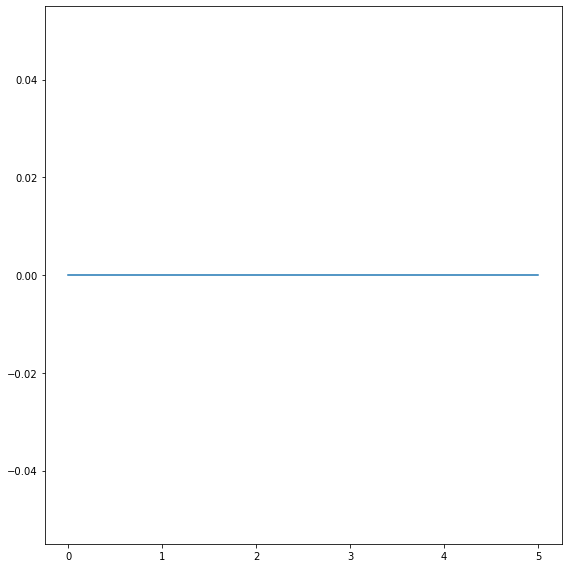

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.18181818e-02 5.57939914e-03 2.51937984e-03 1.10169492e-03
 8.52398524e-01 6.93650794e-01 5.46798030e-01 4.12462908e-01
 2.99474606e-01 2.10633947e-01 1.42261905e-01 9.10344828e-02
 5.53784861e-02 3.16143498e-02 1.63583815e-02 7.38903394e-03
 3.27925840e-03 1.41203704e+00 1.21093750e+00 1.01546392e+00
 8.19672131e-01]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.31818182e-03 6.22317597e-04 2.81007752e-04 1.22881356e-04
 7.68757688e-02 7.93650794e-02 7.43842365e-02 6.11275964e-02
 4.50087566e-02 3.06748466e-02 1.98214286e-02 1.22758621e-02
 7.29083665e-03 4.12556054e-03 2.12716763e-03 9.60835509e-04
 4.26419467e-04 2.15277778e-01 2.21093750e-01 2.02577320e-01
 1.62950820e-01]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.05454545e-02 4.97854077e-03 2.24806202e-03 9.83050847e-04
 1.02583026e+00 8.01587302e-01 5.96059113e-01 4.24332344e-01
 2.90718039e-01 1.91206544e-01 1.22023810e-01 7.55172414e-02
 4.58167331e-02 2.63452915e-02 1.35838150e-02 6.13577023e-03
 2.72305910e-03 1.72453704e+00 1.39843750e+00 1.10824742e+00
 8.39344262e-01]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[4.23636364e-03 2.00000000e-03 9.03100775e-04 3.94915254e-04
 7.66297663e-01 5.28571429e-01 3.45320197e-01 2.17507418e-01
 1.33450088e-01 8.07770961e-02 4.85714286e-02 2.90000000e-02
 1.71912351e-02 9.80941704e-03 5.06358382e-03 2.28720627e-03
 1.01506373e-03 1.21527778e+00 8.98437500e-01 6.34020619e-01
 4.26229508e-01]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[9.18181818e-04 4.33476395e-04 1.95736434e-04 8.55932203e-05
 2.50922509e-02 2.84920635e-02 3.03448276e-02 2.99703264e-02
 2.66199650e-02 2.08588957e-02 1.47619048e-02 9.65517241e-03
 5.87649402e-03 3.32959641e-03 1.71676301e-03 7.75456919e-04
 3.44148320e-04 7.60416667e-02 8.90625000e-02 9.79381443e-02
 9.60655738e-02]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.02318182 0.01094421 0.00494186 0.00216102 0.67527675 0.55
 0.4453202  0.36498516 0.30297723 0.25153374 0.20595238 0.16103448
 0.11673307 0.07443946 0.03884393 0.01754569 0.00778679 1.14236111
 0.96875    0.82989691 0.72131148]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.03109091 0.01467811 0.00662791 0.00289831 0.82902829 0.6952381
 0.58128079 0.4925816  0.41856392 0.35480573 0.29285714 0.22931034
 0.16334661 0.10213004 0.0534104  0.02412533 0.01070684 1.38888889
 1.21875    1.07731959 0.96721311]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.90454545 0.42703863 0.19282946 0.08432203 5.0799508  4.95238095
 4.80295567 4.65875371 4.48336252 4.29447853 4.0952381  3.79310345
 3.36653386 2.47757848 1.30635838 0.59007833 0.26187717 5.9837963
 5.8125     5.77319588 5.7704918 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.20545455 0.09785408 0.04418605 0.01932203 1.25461255 1.00793651
 0.76847291 0.57566766 0.43782837 0.34253579 0.27916667 0.24137931
 0.23306773 0.28587444 0.24739884 0.11227154 0.04982619 1.16898148
 1.1015625  0.93814433 0.73770492]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.18454545 0.08969957 0.04050388 0.01771186 1.59901599 1.32539683
 1.07881773 0.87833828 0.72854641 0.6206544  0.54464286 0.4862069
 0.43227092 0.36547085 0.24566474 0.11331593 0.05028969 2.02546296
 1.8046875  1.54123711 1.27213115]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.02927273 0.01978541 0.00893411 0.00390678 0.06150062 0.06912698
 0.07339901 0.07388724 0.0704028  0.06278119 0.05160714 0.03931034
 0.02928287 0.02309417 0.02774566 0.01890339 0.00838934 0.02858796
 0.03398437 0.0393299  0.04327869]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.42090909 0.21974249 0.09922481 0.04338983 1.94341943 1.65079365
 1.36945813 1.14540059 0.98774081 0.88241309 0.81547619 0.77586207
 0.75099602 0.72533632 0.55953757 0.27937337 0.1239861  2.41898148
 2.1796875  1.8814433  1.58688525]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.01263636 0.01755365 0.00794574 0.00347458 0.01586716 0.01793651
 0.01950739 0.02038576 0.02049037 0.02014315 0.01910714 0.01737931
 0.01507968 0.01233184 0.01046243 0.01830287 0.00812283 0.00696759
 0.00828125 0.00969072 0.01081967]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00400909 0.00201717 0.00091085 0.00039831 0.04514145 0.05015873
 0.04906404 0.0421365  0.03309982 0.02423313 0.01720238 0.01206897
 0.00854582 0.00634529 0.00535838 0.00284595 0.00126304 0.04039352
 0.04914063 0.05618557 0.05737705]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00143636 0.00067811 0.0003062  0.0001339  0.12792128 0.12142857
 0.1        0.07121662 0.04640981 0.02862986 0.01714286 0.01003448
 0.00585657 0.00331839 0.00172254 0.00077807 0.00034531 0.11921296
 0.13046875 0.13092784 0.1147541 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00218182 0.00103433 0.00046705 0.00020424 0.01254613 0.01452381
 0.01586207 0.01611276 0.01472855 0.01216769 0.00934524 0.0067931
 0.005      0.00397982 0.00318497 0.00149347 0.0006628  0.01005787
 0.0121875  0.01438144 0.0162623 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00184545 0.00087554 0.00039535 0.00017288 0.01549815 0.01769841
 0.01896552 0.01893175 0.017338   0.01441718 0.01089286 0.00772414
 0.00531873 0.00369955 0.00249711 0.00115927 0.00051448 0.0125
 0.01507812 0.01768041 0.01963934]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[7.36363636e-06 3.48497854e-06 1.57364341e-06 6.88135593e-07
 3.55473555e-05 4.11904762e-05 4.59113300e-05 4.95548961e-05
 5.09632224e-05 4.84662577e-05 4.04761905e-05 3.05862069e-05
 2.23107570e-05 1.63677130e-05 1.04624277e-05 4.77806789e-06
 2.12050985e-06 2.85879630e-05 3.44531250e-05 4.07216495e-05
 4.65573770e-05]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.23636364e-03 5.83690987e-04 2.63565891e-04 1.15254237e-04
 2.50922509e-01 1.80952381e-01 1.20197044e-01 7.50741840e-02
 4.50087566e-02 2.65848671e-02 1.55357143e-02 9.03448276e-03
 5.21912351e-03 2.93721973e-03 1.52023121e-03 6.86684073e-04
 3.04750869e-04 5.00000000e-01 3.62500000e-01 2.48453608e-01
 1.60983607e-01]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[2.28181818e-03 1.07725322e-03 4.86434109e-04 2.12711864e-04
 2.05412054e-01 1.79365079e-01 1.41379310e-01 1.02670623e-01
 7.09281961e-02 4.75460123e-02 3.11904762e-02 1.98275862e-02
 1.20717131e-02 6.87219731e-03 3.54335260e-03 1.60052219e-03
 7.10312862e-04 4.82638889e-01 4.15625000e-01 3.33505155e-01
 2.50491803e-01]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[3.22727273e-03 8.79828326e-03 8.83720930e-03 3.87288136e-03
 2.10332103e-06 2.43650794e-06 2.74384236e-06 3.05637982e-06
 3.41506130e-06 3.94683027e-06 4.69047619e-06 6.00000000e-06
 1.00398406e-05 4.39461883e-05 1.34682081e-03 7.54569191e-03
 8.47045191e-03 2.52314815e-08 3.03906250e-08 3.59278351e-08
 4.13114754e-08]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


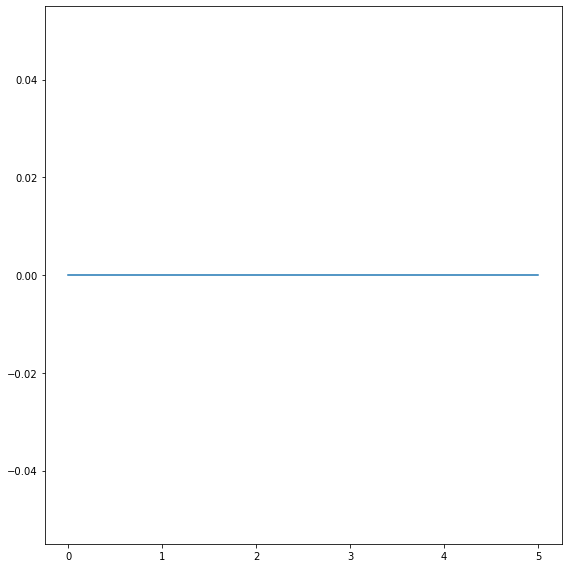

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.63581489 0.47058824 0.33380282 0.22704918 0.14504717 0.08659517
 0.04786765 0.02358696 0.0100463  2.16494845 1.85314685 1.62019231
 1.39354839 1.15448852 0.91287386 0.69212598 0.50232558 0.34417344
 0.22152886 0.13070175 0.07009346]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.11851107 0.08043217 0.05197183 0.0325     0.0195283  0.01127346
 0.00619118 0.00305072 0.00129938 0.50721649 0.48881119 0.43269231
 0.3483871  0.26096033 0.18205462 0.12125984 0.07767442 0.04796748
 0.02839314 0.01605263 0.0085514 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.60160966 0.40816327 0.26549296 0.16680328 0.10165094 0.06005362
 0.03360294 0.0165942  0.0070679  2.65979381 2.16783217 1.79807692
 1.43870968 1.0960334  0.78283485 0.53070866 0.34186047 0.21273713
 0.12839314 0.07447368 0.0403271 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.27364185 0.17046819 0.10352113 0.06229508 0.03726415 0.02184987
 0.01213235 0.00597826 0.0025463  1.73195876 1.34265734 1.00961538
 0.72580645 0.49686848 0.32379714 0.20551181 0.12604651 0.07669377
 0.04602184 0.02692982 0.01453271]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.08128773 0.06110444 0.04253521 0.02795082 0.01726415 0.01004021
 0.00551471 0.00271739 0.00115741 0.19896907 0.22797203 0.24711538
 0.23483871 0.19624217 0.14954486 0.10629921 0.07162791 0.04579946
 0.02776911 0.01570175 0.00836449]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.63380282 0.55582233 0.48028169 0.40245902 0.31367925 0.21715818
 0.13088235 0.06485507 0.02762346 1.77319588 1.5034965  1.33173077
 1.20967742 1.12108559 1.04291287 0.96062992 0.86046512 0.73441734
 0.57878315 0.40263158 0.22990654]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.87323944 0.78151261 0.68450704 0.57786885 0.45754717 0.32439678
 0.19632353 0.09746377 0.04151235 2.1443299  1.86713287 1.70673077
 1.6        1.52192067 1.44343303 1.33858268 1.2        1.02439024
 0.81435257 0.5745614  0.33551402]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[5.69416499 5.57022809 5.41549296 5.24590164 4.97641509 4.54423592
 3.42647059 1.71376812 0.72993827 6.92783505 6.42657343 6.34615385
 6.41935484 6.47181628 6.48894668 6.4488189  6.3255814  6.17886179
 5.975039   5.57017544 4.13084112]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.55533199 0.41176471 0.30985915 0.24303279 0.20212264 0.19571046
 0.30441176 0.28623188 0.12222222 0.70412371 0.77622378 0.82692308
 0.78709677 0.66388309 0.51625488 0.38267717 0.28       0.2100271
 0.16848674 0.16052632 0.33925234]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.04627767 0.87154862 0.74647887 0.65163934 0.58254717 0.5227882
 0.45147059 0.30507246 0.13209877 2.2371134  2.16083916 1.97596154
 1.70967742 1.43215031 1.18725618 1.         0.85116279 0.74254743
 0.66458658 0.59736842 0.51869159]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.04567404 0.0457383  0.04387324 0.04       0.03396226 0.02680965
 0.02102941 0.02673913 0.01728395 0.01268041 0.01524476 0.01846154
 0.02180645 0.02463466 0.02652796 0.02755906 0.02753488 0.02661247
 0.024961   0.02219298 0.01878505]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.34004024 1.15486194 1.02816901 0.94262295 0.88443396 0.8458445
 0.80882353 0.67753623 0.31944444 2.6185567  2.55944056 2.36538462
 2.08064516 1.77453027 1.50845254 1.30708661 1.15813953 1.05420054
 0.98595944 0.92982456 0.87850467]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.01160966 0.0119928  0.01204225 0.01180328 0.01125    0.01049598
 0.00970588 0.00880435 0.01898148 0.003      0.0036014  0.004375
 0.00519355 0.00590814 0.00646294 0.00682677 0.00697674 0.00699187
 0.00692668 0.00681579 0.00705607]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.05090543 0.04057623 0.03007042 0.02131148 0.01474057 0.01014745
 0.00723529 0.00623188 0.00341049 0.03371134 0.04146853 0.05144231
 0.06032258 0.06325678 0.05786736 0.04716535 0.0352093  0.02498645
 0.01716069 0.01157895 0.0078972 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.08672032 0.05834334 0.03661972 0.02192623 0.0128066  0.00734584
 0.00405882 0.00201812 0.00085957 0.0943299  0.10909091 0.12403846
 0.13       0.12150313 0.0976593  0.06858268 0.04362791 0.02634146
 0.01546022 0.00877193 0.00471963]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.01722334 0.01656663 0.01415493 0.01098361 0.00811321 0.00591153
 0.00459559 0.00394928 0.00180556 0.00736082 0.00895105 0.01096154
 0.01322581 0.01538622 0.01690507 0.01716535 0.01530233 0.01238482
 0.00932917 0.00675439 0.00509346]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.02032193 0.01944778 0.01676056 0.0129918  0.00936321 0.00642091
 0.00435294 0.00307971 0.00138889 0.00908247 0.01104895 0.01360577
 0.01635484 0.01876827 0.02028609 0.02031496 0.01827907 0.01479675
 0.01090484 0.00747368 0.00490654]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[5.15090543e-05 5.46218487e-05 5.39436620e-05 4.71311475e-05
 3.65566038e-05 2.66756032e-05 1.96323529e-05 1.34420290e-05
 5.87962963e-06 2.09278351e-05 2.53146853e-05 3.11538462e-05
 3.74193548e-05 4.38413361e-05 4.95448635e-05 5.42519685e-05
 5.58139535e-05 5.14905149e-05 4.16536661e-05 3.05263158e-05
 2.19626168e-05]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[9.97987928e-02 5.99039616e-02 3.52112676e-02 2.05737705e-02
 1.18632075e-02 6.74262735e-03 3.70588235e-03 1.82608696e-03
 7.77777778e-04 8.90721649e-01 6.33566434e-01 4.45673077e-01
 3.02258065e-01 1.96868476e-01 1.23146944e-01 7.48031496e-02
 4.42790698e-02 2.58536585e-02 1.48985959e-02 8.38596491e-03
 4.47196262e-03]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.17887324 0.12364946 0.08309859 0.0545082  0.03396226 0.01997319
 0.01095588 0.00539855 0.00229938 0.96701031 0.8041958  0.66346154
 0.51935484 0.39248434 0.28608583 0.20314961 0.14046512 0.09295393
 0.05694228 0.03236842 0.01724299]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[4.68812877e-08 5.30612245e-08 6.10563380e-08 7.33606557e-08
 1.01886792e-07 1.91689008e-07 1.30882353e-06 2.97463768e-04
 8.81172840e-03 2.90721649e-10 3.50349650e-10 4.30288462e-10
 5.19354839e-10 6.13778706e-10 7.11313394e-10 8.26771654e-10
 9.81395349e-10 1.28455285e-09 2.05928237e-09 5.00877193e-09
 9.57943925e-08]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


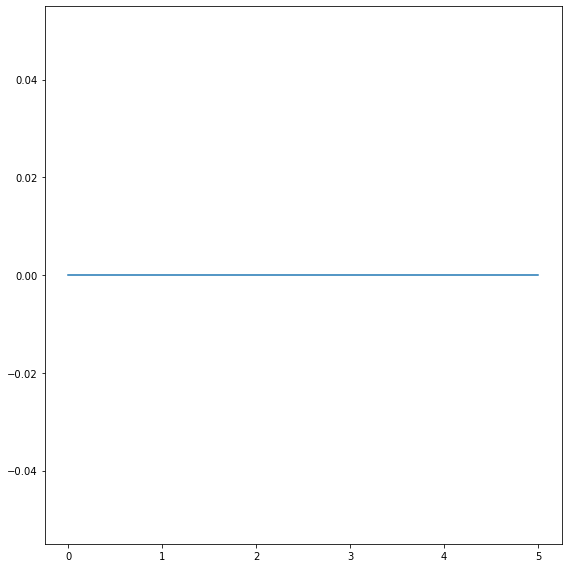

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.03275109 3.29245283 2.66060606 2.30578512 2.04285714 1.78682171
 1.51399491 1.216      0.95098039 0.70760234 0.49828179 0.32277228
 0.1878453  0.09577465 5.00892857 3.83060109 3.12323944 2.72727273
 2.44592346 2.16400911 1.85714286]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00399563 1.09433962 0.93333333 0.78099174 0.63142857 0.48643411
 0.3562341  0.2472     0.16617647 0.10672515 0.06597938 0.03871287
 0.02160221 0.01101408 2.20535714 1.71038251 1.32042254 1.03110048
 0.80865225 0.61845103 0.45488722]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.01886463 4.10377358 3.16363636 2.59917355 2.15428571 1.73255814
 1.32315522 0.936      0.6372549  0.40935673 0.25429553 0.15247525
 0.08674033 0.04478873 6.36607143 4.66120219 3.62676056 2.96650718
 2.4625624  1.97038724 1.4962406 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00679039 2.33018868 1.82424242 1.4214876  1.08       0.78488372
 0.54580153 0.3616     0.23186275 0.14473684 0.0895189  0.05445545
 0.03187845 0.01642254 2.88392857 2.38251366 1.87323944 1.45454545
 1.11148087 0.81776765 0.57368421]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.0039083  0.47924528 0.5        0.5        0.46       0.38953488
 0.30661578 0.2272     0.16176471 0.10964912 0.06975945 0.04118812
 0.02298343 0.01171831 1.07142857 1.01639344 0.9084507  0.79186603
 0.67387687 0.5501139  0.43007519]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.10786026 2.71698113 2.18181818 1.88429752 1.73142857 1.65697674
 1.61577608 1.568      1.5        1.37719298 1.1975945  0.94653465
 0.64640884 0.34647887 4.13392857 3.17486339 2.56338028 2.25598086
 2.14642263 2.15261959 2.17293233]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.15720524 3.26415094 2.67878788 2.38429752 2.26       2.22868217
 2.21374046 2.16       2.06862745 1.89473684 1.64261168 1.2970297
 0.89502762 0.49014085 4.9375     3.84699454 3.18661972 2.89473684
 2.8452579  2.8929385  2.96992481]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 1.94323144  8.62264151  7.21212121  6.73553719  6.65714286  6.80232558
  6.95928753  7.032       7.05882353  7.01754386  6.90721649  6.72277228
  6.35359116  4.28169014 11.33928571  8.90710383  7.46478873  6.9138756
  6.8718802   7.06150342  7.26315789]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.29257642 0.36792453 0.40787879 0.47107438 0.53428571 0.56395349
 0.53307888 0.4424     0.33872549 0.24766082 0.18213058 0.14257426
 0.13535912 0.4084507  0.19017857 0.20491803 0.2306338  0.27033493
 0.31946755 0.35990888 0.37218045]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.33187773 2.31132075 2.3030303  2.25619835 2.08       1.82170543
 1.5394402  1.288      1.08333333 0.92982456 0.8161512  0.72970297
 0.6519337  0.55211268 2.32142857 2.33879781 2.34859155 2.30861244
 2.14642263 1.90205011 1.61654135]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.02860262 0.00600943 0.00684848 0.00822314 0.01002857 0.01193798
 0.01374046 0.01504    0.01598039 0.01640351 0.01656357 0.01663366
 0.01674033 0.01642254 0.00300893 0.0032623  0.00373239 0.00447368
 0.00547421 0.00657175 0.00759398]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.73362445 2.66037736 2.67878788 2.65702479 2.48571429 2.20930233
 1.90839695 1.624      1.41176471 1.25438596 1.14604811 1.06930693
 1.         0.92394366 2.66964286 2.69945355 2.73239437 2.72727273
 2.56239601 2.30068337 1.9924812 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00768559 0.00138679 0.00157576 0.00190083 0.00232286 0.0027907
 0.00321883 0.003568   0.00384314 0.00400585 0.00412371 0.00424752
 0.00445856 0.00535211 0.00068036 0.0007377  0.00084507 0.00101675
 0.00125291 0.00151481 0.00177444]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.0070524  0.02943396 0.03412121 0.04214876 0.05257143 0.0624031
 0.06692112 0.06224    0.05147059 0.03888889 0.02783505 0.0190099
 0.01259669 0.00828169 0.02696429 0.02961749 0.03443662 0.0423445
 0.0530782  0.06389522 0.06902256]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00222707 0.07028302 0.07878788 0.09256198 0.108      0.11841085
 0.11743003 0.1008     0.0745098  0.04883041 0.03006873 0.01782178
 0.01005525 0.0051831  0.04964286 0.05377049 0.06091549 0.0722488
 0.08652246 0.09897494 0.1037594 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00430131 0.00529245 0.00606061 0.00739669 0.00917143 0.01122093
 0.01335878 0.0152     0.01622549 0.01555556 0.01328179 0.01019802
 0.00734807 0.00552113 0.00367857 0.00401639 0.00461268 0.00562201
 0.00705491 0.00876993 0.0106015 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00342795 0.00651887 0.00745455 0.00913223 0.01137143 0.01389535
 0.01641221 0.01832    0.01936275 0.01865497 0.01603093 0.01207921
 0.00828729 0.00526761 0.00452679 0.00494536 0.00570423 0.00696172
 0.00873544 0.0108656  0.01315789]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.51528384e-05 1.50943396e-05 1.72727273e-05 2.09917355e-05
 2.60285714e-05 3.17829457e-05 3.79134860e-05 4.38400000e-05
 4.95098039e-05 5.40935673e-05 5.39518900e-05 4.50495050e-05
 3.30386740e-05 2.34647887e-05 1.05357143e-05 1.14754098e-05
 1.31690141e-05 1.60287081e-05 1.99667221e-05 2.48291572e-05
 3.01503759e-05]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[2.08951965e-03 1.57547170e+00 1.04242424e+00 7.23140496e-01
 5.02857143e-01 3.43023256e-01 2.26463104e-01 1.42400000e-01
 8.72549020e-02 5.23391813e-02 3.07560137e-02 1.77227723e-02
 9.88950276e-03 5.04225352e-03 2.81250000e+00 1.75956284e+00
 1.14436620e+00 7.82296651e-01 5.45757072e-01 3.74715262e-01
 2.48120301e-01]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00805677 1.8490566  1.43636364 1.15289256 0.93428571 0.74224806
 0.58015267 0.44       0.32647059 0.23070175 0.15085911 0.08970297
 0.0501105  0.0255493  3.48214286 2.54098361 1.92253521 1.53110048
 1.26289517 1.04441913 0.84962406]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 2.68447837e-05 8.56000000e-05
 1.31862745e-04 1.35672515e-04 9.65635739e-05 5.57425743e-05
 3.11049724e-05 1.58591549e-05 0.00000000e+00 0.00000000e+00
 0.00000000e+00 1.99521531e-05 1.06322795e-04 2.48291572e-04
 4.57142857e-04]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 6.55216285e-06 2.08800000e-05
 3.21568627e-05 3.30409357e-05 2.35395189e-05 1.35643564e-05
 7.56906077e-06 3.85915493e-06 0.00000000e+00 0.00000000e+00
 0.00000000e+00 4.85645933e-06 2.59567388e-05 6.04783599e-05
 1.11278195e-04]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[9.27947598e-05 3.44339623e-12 3.93333333e-12 4.79338843e-12
 5.94285714e-12 7.32558140e-12 8.89312977e-12 1.06400000e-11
 1.30882353e-11 1.72222222e-11 2.68041237e-11 5.62376238e-11
 2.39779006e-10 4.90140845e-08 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


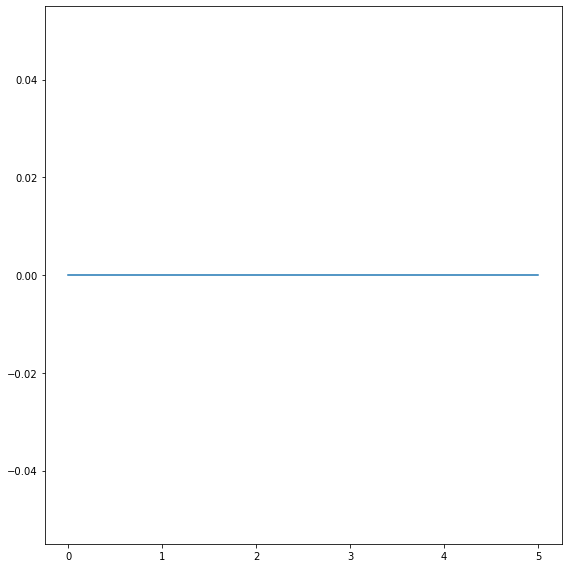

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 1.54807692  1.23964497  0.95892857  0.6952381   0.44756098  0.25454545
  7.72566372  5.67708333  4.31746032  3.51626016  3.07586207  2.77884615
  2.50331126  2.19911504  1.87215909  1.55477032  1.26213592  0.93548387
  0.58455882 12.09090909  8.63157895]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.32548077 0.22307692 0.14642857 0.08994709 0.05213415 0.02878788
 4.36283186 3.17708333 2.28253968 1.66666667 1.27172414 0.99038462
 0.76821192 0.57964602 0.42613636 0.30035336 0.19848975 0.12064516
 0.06875    8.65454545 6.10526316]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 1.07211538  0.72189349  0.46607143  0.28994709  0.17195122  0.096633
 10.08849558  7.08333333  5.17460317  3.98373984  3.25517241  2.70192308
  2.17218543  1.65486726  1.18181818  0.80035336  0.51995685  0.32387097
  0.18897059 16.09090909 11.15789474]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.38653846 0.25059172 0.16017857 0.10126984 0.06219512 0.03636364
 3.32743363 2.91145833 2.39047619 1.86585366 1.44827586 1.10576923
 0.82119205 0.5840708  0.39772727 0.26325088 0.17367853 0.11290323
 0.06948529 3.63636364 3.33684211]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.32596154 0.23579882 0.16142857 0.10116402 0.05859756 0.0323569
 2.2920354  2.00520833 1.64126984 1.31910569 1.08275862 0.9
 0.74172185 0.59292035 0.46022727 0.3409894  0.23300971 0.14258065
 0.08125    4.75454545 3.98947368]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[2.20192308 2.15680473 2.03571429 1.80952381 1.40243902 0.91245791
 6.30088496 4.72916667 3.58730159 2.90650407 2.60689655 2.54807692
 2.62913907 2.76106195 2.86931818 2.91519435 2.89104639 2.57419355
 1.88235294 9.27272727 7.15789474]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 3.00961538  2.93786982  2.76785714  2.43386243  1.88414634  1.23905724
  7.48672566  5.67708333  4.38095238  3.63821138  3.35172414  3.375
  3.52980132  3.73893805  3.86363636  3.90459364  3.8403452   3.4
  2.48897059 11.09090909  8.47368421]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 7.45192308  7.5147929   7.51785714  7.46031746  7.25609756  6.83501684
 15.66371681 11.82291667  9.17460317  7.64227642  7.04827586  7.00961538
  7.21854305  7.52212389  7.72727273  7.84452297  7.92880259  7.93548387
  7.68382353 21.45454545 16.57894737]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.34663462 0.28372781 0.21607143 0.15978836 0.12256098 0.12659933
 0.10088496 0.1046875  0.11301587 0.12723577 0.15034483 0.18173077
 0.21258278 0.23495575 0.23863636 0.21908127 0.18122977 0.14
 0.10808824 0.05354545 0.05473684]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.36057692 1.15088757 0.99285714 0.87619048 0.7804878  0.6969697
 2.36283186 2.36458333 2.37460317 2.37804878 2.34482759 2.20192308
 1.9602649  1.68141593 1.41761364 1.204947   1.04746494 0.92903226
 0.82352941 2.4        2.41052632]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00850962 0.0091716  0.00967857 0.01020106 0.01103659 0.01276094
 0.00157522 0.00164062 0.0017746  0.0020122  0.00241379 0.00297115
 0.00360265 0.00423894 0.00480114 0.00531802 0.00581446 0.00651613
 0.00779412 0.00082727 0.00085263]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.72115385 1.49408284 1.33214286 1.21693122 1.13414634 1.05387205
 2.69911504 2.71354167 2.73968254 2.76422764 2.77241379 2.625
 2.37086093 2.07522124 1.78693182 1.56183746 1.40237325 1.29032258
 1.18382353 2.73636364 2.75789474]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00200481 0.00218343 0.00233929 0.00248677 0.00270732 0.00313805
 0.00035221 0.00036823 0.0004     0.00045325 0.00054759 0.00067788
 0.00082781 0.00098673 0.00113352 0.00126502 0.00140237 0.00157419
 0.00187868 0.00018455 0.00019053]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.06586538 0.05473373 0.04160714 0.02973545 0.02018293 0.0130303
 0.0259292  0.02729167 0.02984127 0.03455285 0.04234483 0.05326923
 0.06443709 0.07079646 0.06761364 0.05671378 0.0433657  0.03096774
 0.02055147 0.02545455 0.02631579]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.09711538 0.07692308 0.05303571 0.03343915 0.01981707 0.01107744
 0.03327434 0.03484375 0.03777778 0.04288618 0.05158621 0.06317308
 0.07549669 0.08495575 0.08664773 0.07667845 0.0566343  0.03658065
 0.02143382 0.02072727 0.02142105]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.01259615 0.0143787  0.01516071 0.01375661 0.01067073 0.00760943
 0.00245133 0.00257813 0.00280635 0.00321138 0.00393103 0.00496154
 0.00625828 0.00783186 0.0096875  0.01212014 0.01456311 0.01393548
 0.01077206 0.00152727 0.00157895]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.01538462 0.01724852 0.01821429 0.01671958 0.01286585 0.00861953
 0.0030177  0.00316667 0.00346032 0.00396341 0.00484138 0.006125
 0.00774834 0.00964602 0.01190341 0.01459364 0.01747573 0.01716129
 0.01301471 0.00187273 0.00193684]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[3.61057692e-05 4.28994083e-05 5.08928571e-05 5.49206349e-05
 4.68902439e-05 3.36700337e-05 7.00000000e-06 7.34375000e-06
 8.00000000e-06 9.16666667e-06 1.11862069e-05 1.41346154e-05
 1.78145695e-05 2.22123894e-05 2.76420455e-05 3.55123675e-05
 4.78964401e-05 5.56129032e-05 4.66911765e-05 4.35454545e-06
 4.50000000e-06]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 0.15913462  0.09822485  0.05928571  0.03513228  0.02030488  0.01121212
  5.21238938  3.125       1.92063492  1.23577236  0.84137931  0.5875
  0.40596026  0.27168142  0.17471591  0.10883392  0.06655879  0.03980645
  0.02268382 10.09090909  5.89473684]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 0.67788462  0.5147929   0.36428571  0.23174603  0.13414634  0.07407407
  6.66371681  4.640625    3.3015873   2.5         2.02758621  1.73076923
  1.48344371  1.26106195  1.02840909  0.79151943  0.55231931  0.34
  0.19375    13.          8.84210526]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[6.92307692e-04 7.95857988e-04 6.60714286e-04 4.15873016e-04
 2.39634146e-04 1.32323232e-04 0.00000000e+00 0.00000000e+00
 4.73015873e-05 1.57723577e-04 3.58620690e-04 7.67307692e-04
 1.46357616e-03 2.39380531e-03 3.12500000e-03 3.00353357e-03
 2.12513484e-03 1.29032258e-03 7.35294118e-04 0.00000000e+00
 9.15789474e-05]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.68750000e-04 1.94674556e-04 1.61250000e-04 1.01693122e-04
 5.85975610e-05 3.23569024e-05 0.00000000e+00 0.00000000e+00
 1.15238095e-05 3.84146341e-05 8.73103448e-05 1.87500000e-04
 3.56953642e-04 5.84070796e-04 7.64204545e-04 7.36749117e-04
 5.23193096e-04 3.17419355e-04 1.80882353e-04 0.00000000e+00
 2.23684211e-05]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.07926829e-12 3.63636364e-11 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


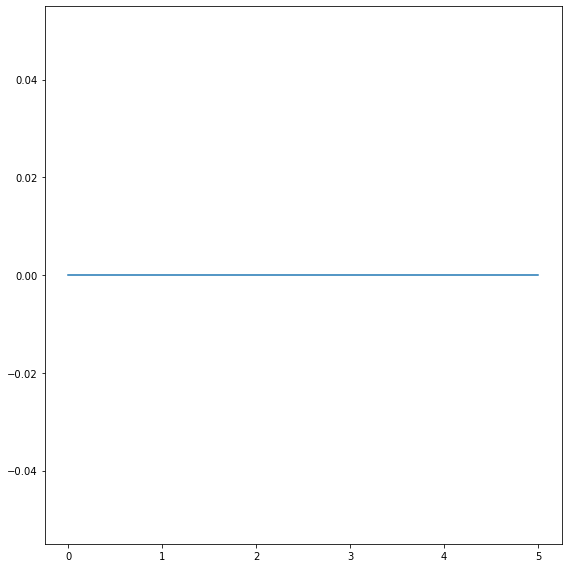

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 6.2962963   4.81273408  3.8882283   3.376       3.08426966  2.81322957
  2.52493438  2.20713073  1.90425532  1.63398693  1.18677043 19.6
 13.78531073  9.77272727  7.06994329  5.32879819  4.24113475  3.65876777
  3.35548173  3.09302326  2.83676704]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 4.19753086  2.88389513  2.05707491  1.552       1.2247191   0.97276265
  0.75853018  0.5704584   0.40638298  0.26470588  0.15797665 18.1
 12.42937853  8.31168831  5.48204159  3.68480726  2.58156028  1.94312796
  1.55813953  1.26976744  1.01426307]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 7.80864198  5.6928839   4.35196195  3.52        2.93258427  2.36964981
  1.81889764  1.30730051  0.89042553  0.57973856  0.35603113 26.9
 18.47457627 12.66233766  8.79017013  6.31519274  4.75177305  3.81516588
  3.17607973  2.60465116  2.01267829]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[2.88888889 2.34082397 1.79548157 1.376      1.06741573 0.79766537
 0.57480315 0.39898132 0.27234043 0.18431373 0.12178988 3.93
 3.6440678  3.24675325 2.7221172  2.10884354 1.56737589 1.18483412
 0.91362126 0.69534884 0.51664025]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 3.07716049  2.32209738  1.77170036  1.424       1.19662921  1.00389105
  0.83464567  0.66383701  0.49574468  0.32941176  0.19688716 10.1
  8.1920904   6.13636364  4.42344045  3.18594104  2.37588652  1.90047393
  1.6179402   1.4         1.19017433]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 5.30864198  4.02621723  3.24613555  2.912       2.91573034  3.07782101
  3.33333333  3.5483871   3.77659574  3.96078431  3.37354086 12.9
 10.6779661   8.21428571  6.06805293  4.53514739  3.60283688  3.20853081
  3.22259136  3.46511628  3.81933439]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 6.35802469  4.90636704  4.0665874   3.744       3.8258427   4.08560311
  4.43569554  4.68590832  4.94680851  5.1372549   4.35797665 16.
 12.82485876  9.70779221  7.20226843  5.48752834  4.46099291  4.07109005
  4.15282392  4.51162791  4.94453249]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[12.4691358   9.60674157  7.90725327  7.192       7.19101124  7.39299611
  7.74278215  7.99660441  8.18085106  8.30065359  8.28793774 27.9
 23.22033898 18.05194805 13.53497164 10.30612245  8.29787234  7.44075829
  7.3089701   7.55813953  7.95562599]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.05679012 0.06104869 0.06848989 0.0816     0.1        0.12062257
 0.13963255 0.15212224 0.15531915 0.14509804 0.11984436 0.0287
 0.02870056 0.02922078 0.03024575 0.03208617 0.03560284 0.04227488
 0.05282392 0.06534884 0.0792393 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[2.41049383 2.41573034 2.42568371 2.392      2.26966292 2.0311284
 1.75328084 1.48556876 1.26595745 1.10457516 0.9766537  2.5
 2.48587571 2.49025974 2.47637051 2.4829932  2.4822695  2.46919431
 2.36212625 2.1372093  1.85419968]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.0008858  0.00095693 0.00107967 0.001288   0.00160674 0.00197276
 0.00237008 0.00275042 0.00315957 0.00363399 0.00451362 0.000442
 0.00044463 0.00045455 0.00047259 0.00050567 0.00056525 0.00067299
 0.00084718 0.00106512 0.0013233 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[2.76851852 2.79026217 2.82996433 2.824      2.71348315 2.46303502
 2.16272966 1.86757216 1.63829787 1.47058824 1.34241245 2.85
 2.83615819 2.8474026  2.85444234 2.86848073 2.88652482 2.90521327
 2.82059801 2.58139535 2.29793978]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.99074074e-04 2.15355805e-04 2.43757432e-04 2.92800000e-04
 3.67415730e-04 4.55252918e-04 5.53805774e-04 6.53650255e-04
 7.57446809e-04 8.75816993e-04 1.08949416e-03 9.86000000e-05
 9.94350282e-05 1.02272727e-04 1.06427221e-04 1.14512472e-04
 1.28368794e-04 1.54028436e-04 1.95016611e-04 2.48837209e-04
 3.12202853e-04]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.02759259 0.03014981 0.03448276 0.04192    0.05308989 0.06498054
 0.07217848 0.06943973 0.05829787 0.04437908 0.03120623 0.026
 0.02615819 0.02688312 0.02797732 0.03015873 0.03404255 0.04113744
 0.05215947 0.0644186  0.07290016]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.02243827 0.02434457 0.02770511 0.03344    0.04213483 0.05252918
 0.06351706 0.07249576 0.07446809 0.05960784 0.03863813 0.0124
 0.01248588 0.01282468 0.01342155 0.01451247 0.01638298 0.01990521
 0.02554817 0.03325581 0.04342314]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00165432 0.00179963 0.00205707 0.002504   0.00320787 0.00412451
 0.00532808 0.00701188 0.01       0.01411765 0.01381323 0.00091
 0.00091525 0.00094481 0.00098677 0.00106689 0.00120567 0.00147393
 0.00190698 0.00251163 0.00340729]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00203395 0.00220974 0.0025327  0.00308    0.00395506 0.00509728
 0.00658793 0.00864177 0.01212766 0.01705882 0.01708171 0.00112
 0.00112994 0.00115909 0.00121361 0.00131519 0.00148227 0.00181043
 0.00234551 0.00309302 0.00419968]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[4.72222222e-06 5.13108614e-06 5.86206897e-06 7.13600000e-06
 9.15730337e-06 1.17509728e-05 1.51968504e-05 2.00339559e-05
 2.91489362e-05 4.67973856e-05 5.56420233e-05 2.60000000e-06
 2.62146893e-06 2.69480519e-06 2.81663516e-06 3.04988662e-06
 3.44680851e-06 4.20379147e-06 5.44850498e-06 7.20930233e-06
 9.76228209e-06]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 3.48765432  2.13483146  1.35552913  0.912       0.64606742  0.44747082
  0.30183727  0.19524618  0.12234043  0.0751634   0.04513619 21.1
 12.09039548  7.01298701  4.1020794   2.46031746  1.54609929  1.03317536
  0.72757475  0.50930233  0.34706815]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 6.08024691  4.36329588  3.31747919  2.744       2.42696629  2.15564202
  1.87926509  1.55687606  1.20212766  0.80392157  0.48249027 26.9
 17.90960452 12.04545455  8.26086957  5.95238095  4.57446809  3.85308057
  3.48837209  3.1627907   2.80507132]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00025401 0.00054307 0.00107372 0.00212    0.00407865 0.00700389
 0.00994751 0.01066214 0.00852128 0.00553595 0.00329961 0.000246
 0.00056215 0.0010974  0.00196597 0.00353741 0.00639007 0.01161137
 0.02009967 0.02976744 0.03423138]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[6.20370370e-05 1.32584270e-04 2.61593341e-04 5.16800000e-04
 1.00000000e-03 1.72373541e-03 2.46456693e-03 2.66553480e-03
 2.12765957e-03 1.38562092e-03 8.24902724e-04 5.99000000e-05
 1.37288136e-04 2.67857143e-04 4.82041588e-04 8.63945578e-04
 1.56028369e-03 2.85308057e-03 4.98338870e-03 7.55813953e-03
 8.89064976e-03]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


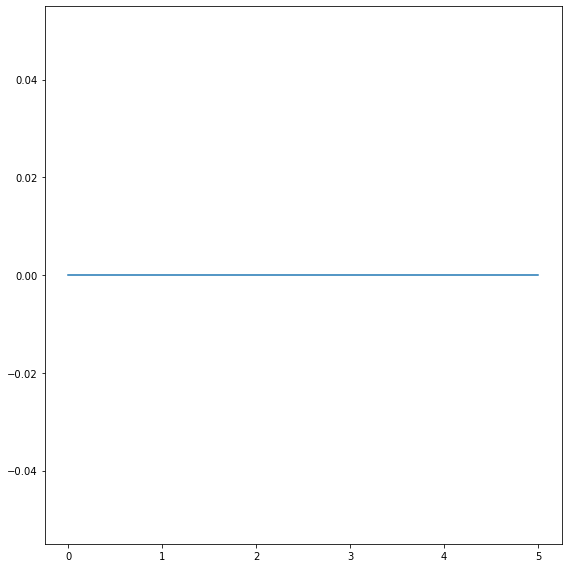

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 2.52066116  2.30519481  2.036      31.97674419 23.20261438 16.40740741
 11.4978903   8.18734793  6.05035971  4.73451327  3.95953757  3.62173038
  3.38068182  3.1372549   2.8525641   2.78629032 49.63609898 39.91803279
 29.31192661 20.6185567  14.30029155]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 0.77066116  0.54480519  0.346      40.         27.32026144 18.07407407
 11.66666667  7.51824818  4.96402878  3.42920354  2.55491329  2.07243461
  1.70454545  1.38235294  1.04487179  0.71774194 95.63318777 65.90163934
 43.16513761 27.57731959 17.34693878]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 1.46694215  1.          0.648      45.23255814 32.15686275 22.18518519
 15.04219409 10.2919708   7.26618705  5.3539823   4.19075145  3.48088531
  2.89772727  2.28431373  1.66666667  1.14112903 72.05240175 56.96721311
 41.05504587 28.35051546 19.09620991]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.37293388 0.26428571 0.1856     4.1744186  3.87581699 3.45555556
 2.89029536 2.20194647 1.57553957 1.11946903 0.82369942 0.63782696
 0.50710227 0.40392157 0.31282051 0.23669355 4.42503639 4.05737705
 3.48623853 2.75773196 2.01166181]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 0.96177686  0.71428571  0.456      22.20930233 17.90849673 13.25925926
  9.34599156  6.45985401  4.53956835  3.32743363  2.6300578   2.25352113
  2.00284091  1.7254902   1.38461538  0.99193548 51.81950509 42.37704918
 31.14678899 21.75257732 14.72303207]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 4.1838843   4.79220779  5.16       16.74418605 14.96732026 12.62962963
  9.74683544  7.17761557  5.28776978  4.10619469  3.55491329  3.50100604
  3.79261364  4.23529412  4.79487179  6.08870968 20.96069869 19.83606557
 18.02752294 15.46391753 12.17201166]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 5.3822314   6.07142857  6.48       21.04651163 18.49673203 15.14814815
 11.4978903   8.46715328  6.31654676  5.          4.39306358  4.40643863
  4.75852273  5.29411765  5.93589744  7.41935484 26.78311499 25.08196721
 22.3853211  18.63402062 14.30029155]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 8.28512397  8.50649351  8.68       33.60465116 30.39215686 26.
 20.54852321 15.45012165 11.58273381  9.07079646  7.80346821  7.52515091
  7.74147727  8.20588235  8.58974359  8.91129032 39.15574964 37.37704918
 34.35779817 29.89690722 24.34402332]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.0927686  0.10519481 0.1136     0.015      0.01496732 0.01507407
 0.01525316 0.01569343 0.01647482 0.01809735 0.02112717 0.02655936
 0.03409091 0.04411765 0.05679487 0.07419355 0.00784571 0.00782787
 0.00775229 0.00775773 0.00781341]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.58057851 1.35064935 1.172      2.63953488 2.62745098 2.62592593
 2.61603376 2.60340633 2.5971223  2.59292035 2.57514451 2.49496982
 2.28693182 2.01960784 1.71794872 1.45564516 2.86754003 2.86885246
 2.8440367  2.83505155 2.81341108]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00161157 0.00196753 0.002484   0.0002314  0.00023203 0.00023519
 0.00024051 0.00024696 0.00026259 0.00029071 0.00034393 0.00043461
 0.00056534 0.0007451  0.00098077 0.00133871 0.00012096 0.00012131
 0.00012156 0.00012216 0.00012405]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.99380165 1.74025974 1.556      3.         2.99346405 2.9962963
 2.99578059 2.99270073 3.00719424 3.01769912 3.03468208 2.9778672
 2.76988636 2.48039216 2.15384615 1.86693548 3.24599709 3.25409836
 3.23853211 3.22164948 3.22157434]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[3.85330579e-04 4.75974026e-04 6.08000000e-04 5.16279070e-05
 5.19607843e-05 5.25925926e-05 5.40084388e-05 5.59610706e-05
 5.96402878e-05 6.63716814e-05 7.89017341e-05 1.00603622e-04
 1.32670455e-04 1.76470588e-04 2.36538462e-04 3.27016129e-04
 2.69286754e-05 2.72131148e-05 2.72935780e-05 2.75773196e-05
 2.81341108e-05]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.07076446 0.05928571 0.0448     0.02686047 0.02699346 0.0272963
 0.0278481  0.02871046 0.0305036  0.03380531 0.03988439 0.0501006
 0.06278409 0.0727451  0.07115385 0.05927419 0.0286754  0.02885246
 0.02880734 0.02886598 0.02930029]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.05661157 0.07077922 0.0608     0.00697674 0.00699346 0.00711111
 0.00727848 0.00759124 0.0081295  0.00911504 0.01095376 0.01430584
 0.01946023 0.0277451  0.0424359  0.06895161 0.00387191 0.00387705
 0.00388991 0.0039433  0.00402332]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00487603 0.00850649 0.0142     0.00051279 0.00051503 0.00052222
 0.00053586 0.00055839 0.00059784 0.00067257 0.00080636 0.00105634
 0.00144886 0.00209804 0.00341667 0.00850806 0.0002853  0.00028525
 0.00028624 0.00028866 0.00029592]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00602273 0.01032468 0.01724    0.00063023 0.00063268 0.00064444
 0.00065823 0.00068613 0.00073381 0.00082301 0.00099133 0.00129779
 0.00177557 0.00257843 0.00420513 0.01028226 0.00034934 0.00035082
 0.00035138 0.00035567 0.00036297]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.40495868e-05 2.48701299e-05 4.88000000e-05 1.46511628e-06
 1.47058824e-06 1.49259259e-06 1.53164557e-06 1.59367397e-06
 1.70503597e-06 1.91592920e-06 2.30635838e-06 3.01810865e-06
 4.14772727e-06 6.01960784e-06 9.87179487e-06 2.51209677e-05
 8.15138282e-07 8.17213115e-07 8.21100917e-07 8.27319588e-07
 8.46938776e-07]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[2.27272727e-01 1.42857143e-01 8.80000000e-02 4.79069767e+01
 2.75163399e+01 1.57037037e+01 8.98734177e+00 5.19464720e+00
 3.07913669e+00 1.89823009e+00 1.24277457e+00 8.65191147e-01
 6.12215909e-01 4.23529412e-01 2.76923077e-01 1.74596774e-01
 1.18631732e+02 6.99180328e+01 3.94954128e+01 2.22938144e+01
 1.26384840e+01]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[  2.33471074   1.76623377   1.132       59.30232558  39.34640523
  26.03703704  17.42616034  12.00729927   8.70503597   6.72566372
   5.63583815   5.11066398   4.71590909   4.21568627   3.46794872
   2.50403226 143.52256186  95.08196721  62.3853211   40.72164948
  27.25947522]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.02964876 0.02084416 0.013      0.00165116 0.00286275 0.00496296
 0.00848101 0.01447689 0.02446043 0.04053097 0.06445087 0.09295775
 0.10880682 0.1        0.07435897 0.0483871  0.00950509 0.01557377
 0.02573394 0.04278351 0.07069971]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00777893 0.00545455 0.003404   0.00040349 0.00069935 0.00121111
 0.00207173 0.00352798 0.00599281 0.01004425 0.01644509 0.0249497
 0.03096591 0.02921569 0.02179487 0.01423387 0.00231441 0.00380328
 0.0062844  0.01043814 0.01734694]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


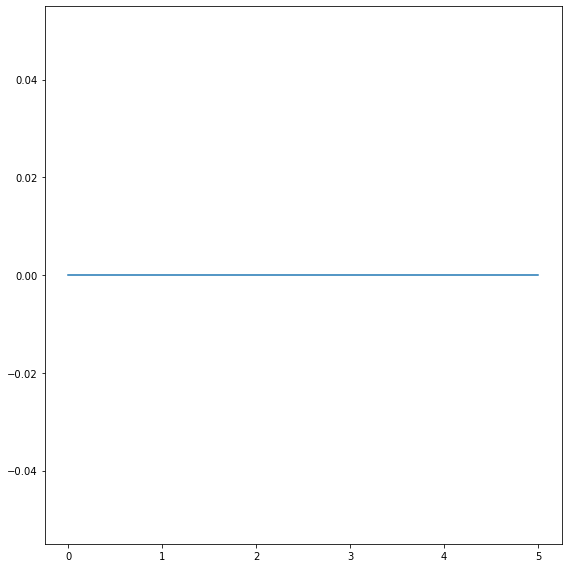

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[10.          7.19806763  5.43604651  4.4198895   3.9272271   3.66371681
  3.44444444  3.17670683 69.78967495 61.62915327 50.71856287 38.38383838
 27.11864407 18.75       12.8742515   9.00684932  6.57947686  5.11056511
  4.35483871  4.02259887  3.75390625]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 11.08333333   7.14975845   4.88372093   3.55432781   2.82308657
   2.33628319   1.88888889   1.3815261  240.91778203 166.13076099
 109.58083832  70.37037037  43.87947269  27.43644068  17.18562874
  11.02739726   7.36418511   5.20884521   3.98387097   3.2259887
   2.5234375 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 12.83333333   8.79227053   6.3372093    4.80662983   3.9272271
   3.27433628   2.62962963   1.91566265 102.86806883  90.03215434
  73.05389222  54.54545455  37.85310734  25.42372881  16.82634731
  11.33561644   7.88732394   5.76167076   4.54032258   3.77966102
   3.0234375 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.38333333 0.93236715 0.64825581 0.48066298 0.39648683 0.35309735
 0.32160494 0.2751004  4.70363289 4.15862808 3.40718563 2.56902357
 1.79096045 1.21822034 0.82634731 0.58219178 0.43863179 0.36240786
 0.33870968 0.34745763 0.346875  ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 10.           6.85990338   4.94186047   3.8305709    3.26223338
   2.88495575   2.49382716   1.9437751  126.00382409 104.18006431
  77.24550898  54.54545455  36.53483992  24.25847458  16.16766467
  10.99315068   7.80684105   5.8968059    4.83064516   4.1920904
   3.50390625]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 9.          6.52173913  4.88372093  4.03314917  3.82685069  4.0619469
  4.59876543  5.42168675 25.8126195  24.97320472 23.71257485 22.05387205
 19.39736347 15.6779661  11.73652695  8.42465753  6.13682093  4.77886978
  4.24193548  4.38418079  4.9609375 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[10.5         7.63285024  5.81395349  4.84346225  4.61731493  4.88495575
  5.5         6.42570281 33.26959847 31.83279743 30.         27.50841751
 23.54048964 18.53813559 13.59281437  9.7260274   7.12273642  5.55282555
  4.91129032  5.03954802  5.6640625 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[18.5        13.67149758 10.40697674  8.5267035   7.86700125  7.96460177
  8.45679012  8.91566265 45.12428298 43.83708467 41.9760479  39.39393939
 35.2165725  29.66101695 23.05389222 16.98630137 12.57545272  9.75429975
  8.46774194  8.36158192  8.7890625 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.007975   0.00826087 0.00895349 0.01029466 0.01292346 0.01743363
 0.025      0.03763052 0.00409178 0.00405145 0.00400599 0.00400673
 0.00397363 0.00398305 0.00402395 0.00414384 0.00442656 0.00501229
 0.00635484 0.00932203 0.01570312]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[2.8        2.77294686 2.75872093 2.72559853 2.67252196 2.48672566
 2.21604938 1.86746988 3.17399618 3.16184352 3.13772455 3.13468013
 3.10734463 3.09322034 3.05988024 3.02739726 2.99798793 2.94840295
 2.88709677 2.72881356 2.4140625 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1.27500000e-04 1.33816425e-04 1.46511628e-04 1.70902394e-04
 2.17063990e-04 2.97345133e-04 4.32098765e-04 6.58634538e-04
 6.30975143e-05 6.29153269e-05 6.28742515e-05 6.29629630e-05
 6.32768362e-05 6.40889831e-05 6.52694611e-05 6.84931507e-05
 7.42454728e-05 8.55036855e-05 1.10483871e-04 1.63841808e-04
 2.78125000e-04]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[3.21666667 3.20772947 3.19767442 3.20441989 3.17440402 3.
 2.71604938 2.32931727 3.59464627 3.57984995 3.56886228 3.56902357
 3.55932203 3.53813559 3.52095808 3.49315068 3.50100604 3.46437346
 3.42741935 3.27683616 2.94140625]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[2.90000000e-05 3.05797101e-05 3.37209302e-05 3.94106814e-05
 5.06900878e-05 7.01769912e-05 1.03086420e-04 1.59437751e-04
 1.41873805e-05 1.42550911e-05 1.41916168e-05 1.43434343e-05
 1.44444444e-05 1.47245763e-05 1.50898204e-05 1.57876712e-05
 1.72032193e-05 1.99017199e-05 2.58870968e-05 3.88135593e-05
 6.64062500e-05]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.03       0.03125604 0.03401163 0.03867403 0.0476788  0.0600885
 0.07160494 0.07068273 0.03135755 0.03129689 0.0311976  0.0313468
 0.03126177 0.0315678  0.03197605 0.03284247 0.03480885 0.03832924
 0.04548387 0.05762712 0.06992187]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00416667 0.0044058  0.00488372 0.00578269 0.00757842 0.01088496
 0.01746914 0.03401606 0.00216061 0.0021329  0.00212575 0.00214478
 0.00216573 0.00220339 0.00226946 0.00238014 0.00259557 0.00304668
 0.00402419 0.00632768 0.01207031]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00030667 0.00032415 0.00035756 0.00042541 0.00055834 0.00080531
 0.0012963  0.00267871 0.0001587  0.00015756 0.00015629 0.00015791
 0.00015932 0.00016208 0.00016707 0.000175   0.00019155 0.00022359
 0.00029597 0.00046441 0.00089453]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.00037667 0.00039807 0.00044186 0.00052118 0.00068507 0.00099115
 0.00159259 0.00329317 0.00019503 0.00019293 0.00019222 0.00019394
 0.00019586 0.00019915 0.00020539 0.00021507 0.00023541 0.00027518
 0.00036371 0.00057062 0.00109766]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[8.75000000e-07 9.27536232e-07 1.02616279e-06 1.21546961e-06
 1.59347553e-06 2.30088496e-06 3.72222222e-06 7.71084337e-06
 4.56978967e-07 4.53376206e-07 4.50898204e-07 4.54545455e-07
 4.59510358e-07 4.67161017e-07 4.80239521e-07 5.03424658e-07
 5.49295775e-07 6.42506143e-07 8.46774194e-07 1.32768362e-06
 2.56250000e-06]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[  7.24166667   4.20289855   2.53488372   1.60773481   1.097867
   0.77522124   0.54197531   0.35301205 305.92734226 188.63879957
 106.58682635  60.26936027  33.89830508  19.06779661  10.77844311
   6.19863014   3.64185111   2.22358722   1.46774194   1.02824859
   0.7109375 ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[ 19.          13.71980676  10.49418605   8.63720074   7.70388959
   7.0619469    6.2345679    4.93975904 369.0248566  244.37299035
 159.28143713 103.7037037   67.98493409  45.97457627  31.9760479
  23.11643836  17.48490946  13.88206388  11.85483871  10.62146893
   8.984375  ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.115      0.17874396 0.25610465 0.32044199 0.3425345  0.30884956
 0.24197531 0.16465863 0.05372849 0.08424437 0.13473054 0.21986532
 0.35781544 0.56779661 0.8502994  1.1130137  1.20120724 1.04422604
 0.80645161 0.61016949 0.4375    ]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0.0285     0.04536232 0.06947674 0.09723757 0.11769134 0.11327434
 0.09074074 0.06144578 0.01311663 0.02057878 0.03287425 0.05387205
 0.08794727 0.14300847 0.2257485  0.3359589  0.44064386 0.46437346
 0.40241935 0.31694915 0.22734375]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


ValueError: x and y must have same first dimension, but have shapes (21,) and (0,)

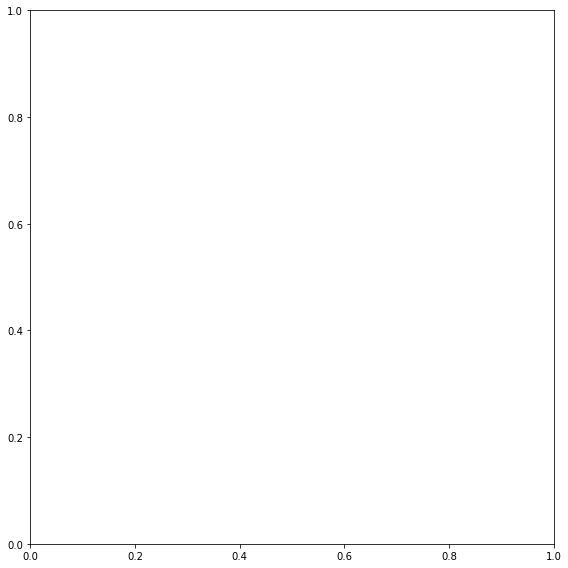

In [331]:
# plt.figure(figsize=(8,8))
# plt.rcParams["figure.figsize"] = [0, 16]
# plt.rcParams["figure.autolayout"] = True
# colors = plt.cm.rainbow(np.linspace(0, 1, len(edit_contour_intensity.columns)))
j=0
for j in np.arange(0,274,21):
    #print(j)
    plt.figure(figsize=(8,8))
    for i in range(len(intensity_array[0])):#len(intensity_array[0])): #looping over the number of elements, 33 total
        #plt.figure(figsize=(8,8))
        plt.plot(np.array(Xi_and_NH_temp['Xi'])[0::13], intensity_array[:,i][j:j+21])
        plt.show()
        intensity_array[:,i][j:j+21].shape
        print(intensity_array[:,i][j:j+21])
        ##j+=21

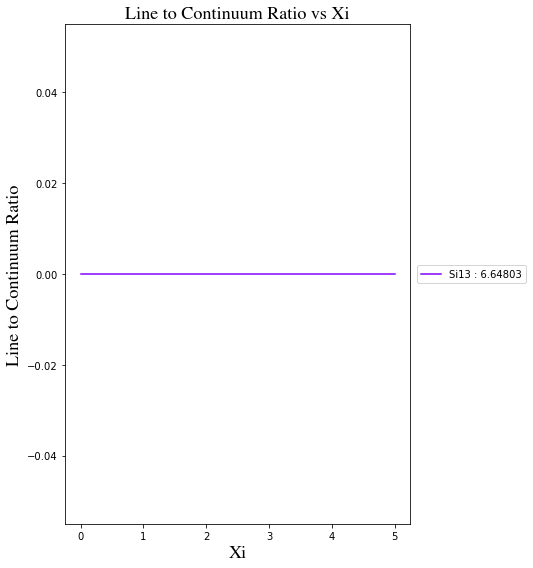

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

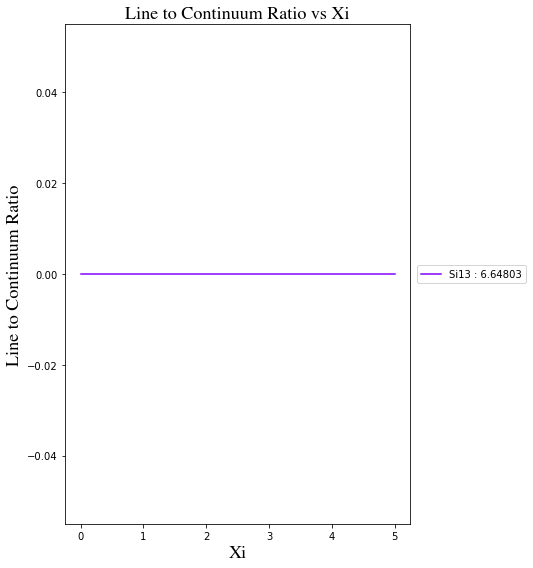

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

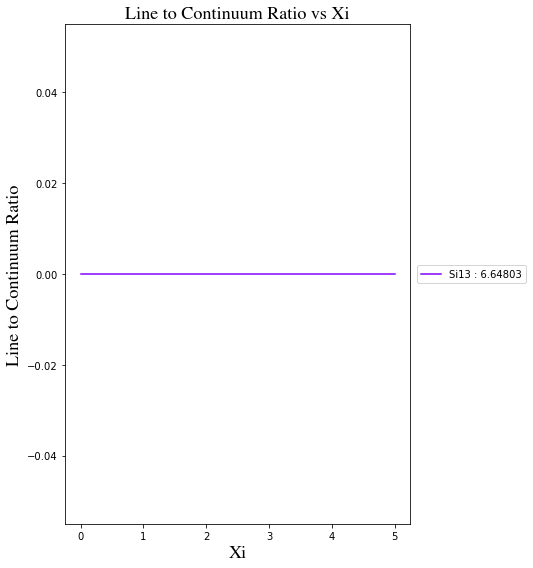

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

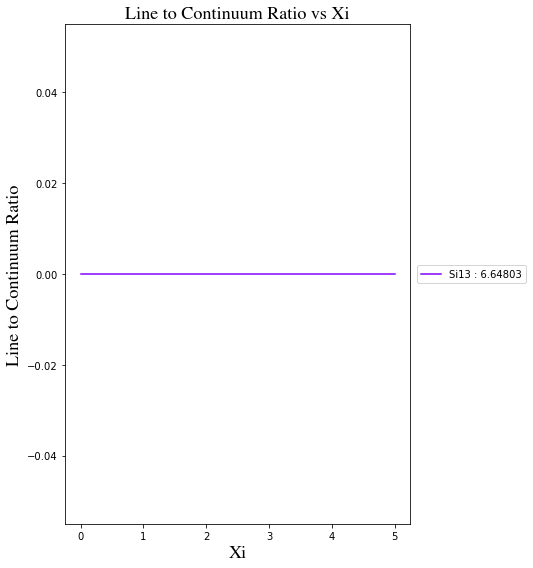

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

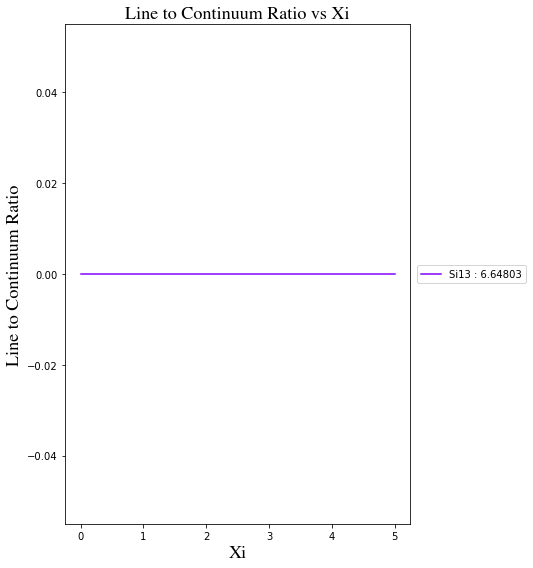

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

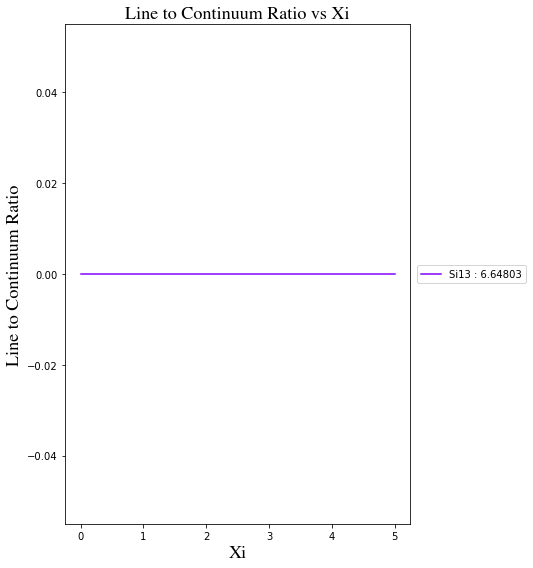

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

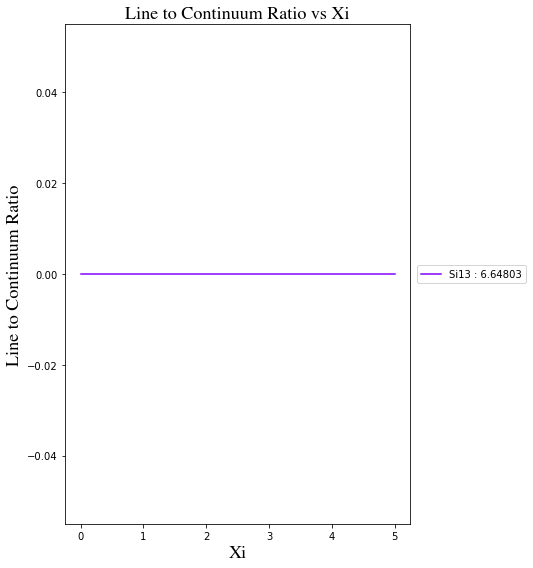

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

KeyboardInterrupt: 

In [152]:

j=0
for j in range(len(np.array(edit_contour_intensity)[0])):
    plt.figure(figsize=(8,8))
    plt.rcParams["figure.figsize"] = [0, 16]
    plt.rcParams["figure.autolayout"] = True
    colors = plt.cm.rainbow(np.linspace(0, 1, len(edit_contour_intensity.columns)))
    for i in range(len(np.array(edit_contour_intensity)[0])):
        #make sure to call every other 13 Xi and column intensities for different values 
        #plt.plot(Xi_and_NH_temp['Xi'][0::13], np.array(edit_contour_intensity)[:,i][::13], color=colors[i], ms=0.5, label = str(edit_contour_intensity.columns[i][0:4])
        plt.plot(Xi_and_NH_temp['Xi'][0::13], np.array(edit_contour_intensity)[:,i][j:j+21], 
                 color=colors[i], ms=0.5, label = str(edit_contour_intensity.columns[i][0:4]) 
                 +' : '+str(edit_contour_intensity.columns[i][5:-1]))
        plt.xlabel('Xi', fontsize=18, fontname= 'Times')
        plt.ylabel('Line to Continuum Ratio', fontsize=18, fontname= 'Times')
        plt.legend(loc='center right', bbox_to_anchor=(1.35, 0.5))
        plt.title('Line to Continuum Ratio vs Xi', fontsize=18, fontname= 'Times')
        plt.show()
#plt.savefig('Intensity_vs_Xi_new', dpi=200)


In [57]:
Xi_and_NH = np.array(Xi_and_NH_temp.iloc[:,0:2])
for num in range(len(Xi_and_NH[:, 0])):
    if Xi_and_NH[:, 0][num] != 0:
        print(num)

13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272


In [58]:
len(Xi_and_NH[::13,:1]) , len(Xi_and_NH[:13,1:2])

(21, 13)

In [59]:
Xi_and_NH = Xi_and_NH_temp.iloc[:,0:2]
Xi_and_NH.to_csv('Xi_and_NH.csv')

In [60]:
Xi_complete = np.array(Xi_and_NH_temp['Xi'])
col_density_complete = np.array(Xi_and_NH_temp['Column_den'])
intensity_complete = np.array(contour_intensity)

In [61]:
Xi_complete.shape,col_density_complete.shape,intensity_complete.shape

((273,), (273,), (273, 33))

In [65]:
# #[X, Y] = np.meshgrid(Xi_complete, col_density_complete) #meshgrid is a python built in function
# [X, Y] = np.meshgrid(Xi_and_NH[::13,:1], Xi_and_NH[:13,1:2])
# print(X.shape)
# newx = Xi_and_NH[::13,:1]
# newy = Xi_and_NH[:13,1:2]
# print(newx.shape, newy.shape)
# newx = newx[:,0]
# newy = newy[:,0]
# print(newx.shape, newy.shape)

# print(newx)
# print(intensity_complete.shape)

# element_index = 15

# intensity = intensity_complete[:,element_index]
# zaxis= np.zeros([len(newy), len(newx)])
# for i in range(len(newy)):
#     zaxis[i,:] = intensity[i*len(newx):(i+1)*len(newx)]
# print(zaxis.shape)
    

In [69]:
[X, Y] = np.meshgrid(Xi_and_NH_temp['Xi'], Xi_and_NH_temp['Column_den'])
X[0], Y[0]

(array([0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
        0.  , 0.  , 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25,
        0.25, 0.25, 0.25, 0.25, 0.5 , 0.5 , 0.5 , 0.5 , 0.5 , 0.5 , 0.5 ,
        0.5 , 0.5 , 0.5 , 0.5 , 0.5 , 0.5 , 0.75, 0.75, 0.75, 0.75, 0.75,
        0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 1.  , 1.  , 1.  ,
        1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.25,
        1.25, 1.25, 1.25, 1.25, 1.25, 1.25, 1.25, 1.25, 1.25, 1.25, 1.25,
        1.25, 1.5 , 1.5 , 1.5 , 1.5 , 1.5 , 1.5 , 1.5 , 1.5 , 1.5 , 1.5 ,
        1.5 , 1.5 , 1.5 , 1.75, 1.75, 1.75, 1.75, 1.75, 1.75, 1.75, 1.75,
        1.75, 1.75, 1.75, 1.75, 1.75, 2.  , 2.  , 2.  , 2.  , 2.  , 2.  ,
        2.  , 2.  , 2.  , 2.  , 2.  , 2.  , 2.  , 2.25, 2.25, 2.25, 2.25,
        2.25, 2.25, 2.25, 2.25, 2.25, 2.25, 2.25, 2.25, 2.25, 2.5 , 2.5 ,
        2.5 , 2.5 , 2.5 , 2.5 , 2.5 , 2.5 , 2.5 , 2.5 , 2.5 , 2.5 , 2.5 ,
        2.75, 2.75, 2.75, 2.75, 2.75, 

In [60]:
#Trying this for only one element. In this case, the 10th column element
Z = np.ones((len(intensity_complete),len(intensity_complete)))*intensity_complete[:, 10]
Z.shape

(273, 273)

In [67]:
#Creating a contour plot using the 10th column element
h = plt.contourf(X, Y, Z)
plt.colorbar()
plt.show()

TypeError: Shapes of x (13, 21) and z (273, 273) do not match

LinAlgError: Singular matrix

<Figure size 0x1152 with 1 Axes>

<ipython-input-27-44767f6f853c>:15: UserWarning: The following kwargs were not used by contour: 'level'
  cp = plt.contourf(X, Y, Z, level=[100], cmap='RdGy',
<ipython-input-27-44767f6f853c>:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(5,5))


IndexError: index 33 is out of bounds for axis 1 with size 33

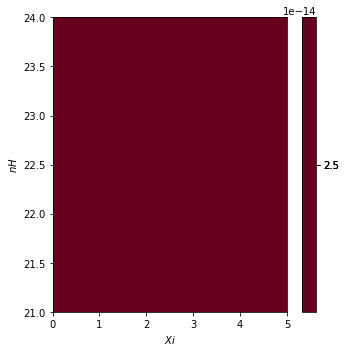

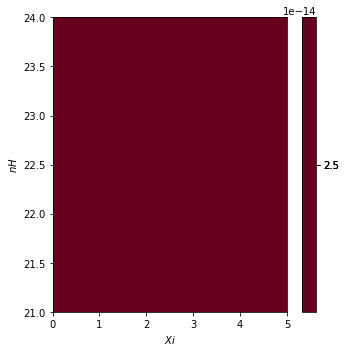

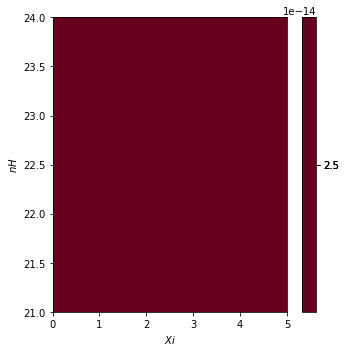

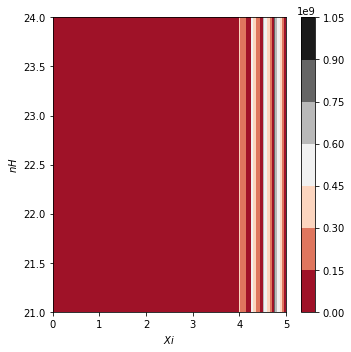

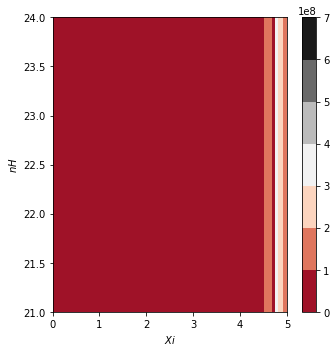

...

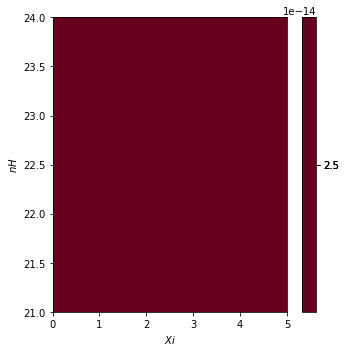

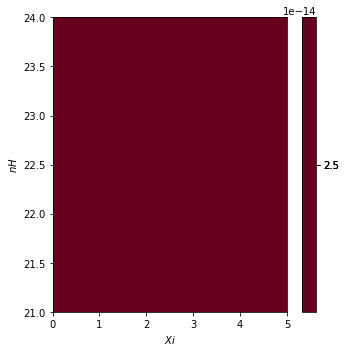

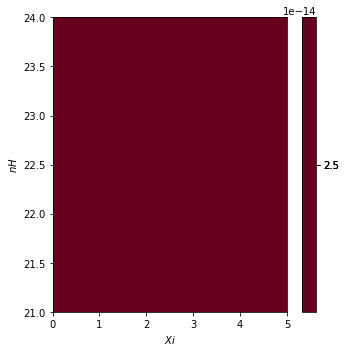

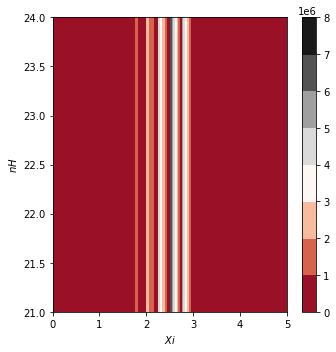

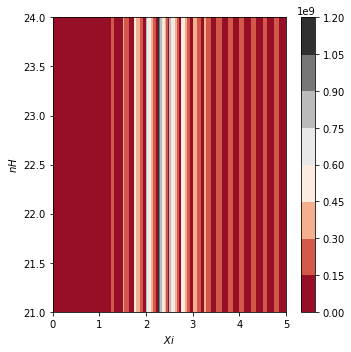

In [27]:
#Iterating to create a contour plot for all 33 elements
%matplotlib inline
import matplotlib as m
cdict = {
  'red'  :  ( (0.0, 0.25, .25), (0.02, .59, .59), (1., 1., 1.)),
  'green':  ( (0.0, 0.0, 0.0), (0.02, .45, .45), (1., .97, .97)),
  'blue' :  ( (0.0, 1.0, 1.0), (0.02, .75, .75), (1., 0.45, 0.45))
}

cm = m.colors.LinearSegmentedColormap('my_colormap', cdict, 1024)

for i in range(len(contour_intensity)):
    Z = np.ones((len(intensity_complete),len(intensity_complete)))*intensity_complete[:, i]
    plt.figure(figsize=(5,5))
    cp = plt.contourf(X, Y, Z, level=[100], cmap='RdGy', 
                      vmin = min(intensity_complete[:,i]), vmax = max(intensity_complete[:,i]))
    plt.colorbar(cp) # Add a colorbar to a plot
    plt.xlabel('$Xi$')
    plt.ylabel('$nH$')

In [35]:
len(contour_intensity)

273

In [32]:
for i in range(len(contour_intensity)):
    Z = np.ones((len(intensity_complete),len(intensity_complete)))*intensity_complete[:, i]

IndexError: index 33 is out of bounds for axis 1 with size 33

Text(0.5, 0, 'z')

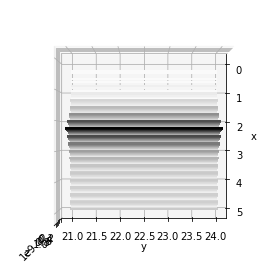

In [28]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.contour3D(X, Y, Z, 50, cmap='binary')
ax.view_init(azim=0, elev=90)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

<ipython-input-29-36a789838695>:4: UserWarning: No contour levels were found within the data range.
  ax[i].contour(X, Y, Z)
/Users/brigettevazquez/opt/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:132: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.canvas.print_figure(bytes_io, **kw)


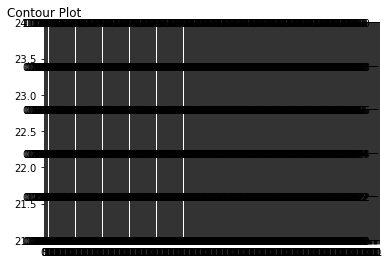

IndexError: index 33 is out of bounds for axis 1 with size 33

In [29]:
fig, ax = plt.subplots(1, len(contour_intensity))
for i in range(len(contour_intensity)):
    Z = np.ones((len(intensity_complete),len(intensity_complete)))*intensity_complete[:, i]
    ax[i].contour(X, Y, Z)
    ax[i].set_title('Contour Plot')
    plt.show()

In [ ]:
#!/usr/bin/env python
# coding: utf-8

# In[1]:


import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt


# ## Conversion of eV into Rydberg for SED (data goes into Cloudy)

# In[2]:


file = pd.read_csv('Book.csv')
file


# In[3]:


ryd_energy = np.array(file['x'])/13.6057039763
flux = np.array(file['y'])*10**(-26)
df = pd.DataFrame(ryd_energy)
df['y']=flux


# In[4]:


df


# In[5]:


df.to_csv('ryd_energy.csv') #Saving the information from above to import into Cloudy later


# ## Plotting the Different Intensity Elements and Xi

# In[6]:


intensity_temp = pd.read_csv('yaxis.csv') #This is actually the z axis 
intensity_temp


# In[7]:


Xi = np.linspace(0,5,11) #Creating this on my own because I know the exact values already
Xi


# In[8]:


plt.figure(figsize=(8,8))
plt.rcParams["figure.figsize"] = [0, 16]
plt.rcParams["figure.autolayout"] = True
colors = plt.cm.rainbow(np.linspace(0, 1, len(intensity_temp.columns)))
for i in range(len(np.array(intensity_temp)[0])):
    plt.plot(Xi, np.array(intensity_temp)[:,i], color=colors[i], ms=0.5, label = str(intensity_temp.columns[i][0:4])
                                                                          +' : '+str(intensity_temp.columns[i][5:-1]))
plt.xlabel('Xi')
plt.ylabel('Intensity [erg $cm^2$ $s^{-1}$]')
plt.legend(loc='center right', bbox_to_anchor=(1.30, 0.5))
plt.title('Intensity vs Xi')
plt.savefig('Intensity_vs_Xi', dpi=200)


# In[9]:


plt.figure(figsize=(8,8))
colors = plt.cm.rainbow(np.linspace(0, 1, len(intensity_temp.columns)))
for i in range(len(intensity_temp.columns)):
    plt.figure(figsize=(8,8))
    plt.plot(Xi, np.array(intensity_temp)[:,i], color=colors[i], ms=0.5, label = str(intensity_temp.columns[i][0:4])
                                                                          +' : '+str(intensity_temp.columns[i][5:-1]))
    plt.xlabel('Xi')
    plt.ylabel('Intensity [erg $cm^2$ $s^{-1}$]')
    plt.legend(loc='center right', bbox_to_anchor=(1.30, 0.5))
    plt.title('Xi vs Intensity')
#    plt.show()
    plt.savefig('Element_Intensities/'+str(intensity_temp.columns[i][0:4]+'.png'), dpi=200)


# ### Finding the top 5 most intense lines

# In[10]:


intensity_array = np.array(intensity_temp)


# In[11]:


max_val = np.ones(len(intensity_array[0]))
for i in range(len(intensity_array[0])):
    print(intensity_temp.columns[i][0:4]+':'+ intensity_temp.columns[i][5:-1], 
          ' Maximum Value:', max(intensity_array[:,i]))
    max_val[i] = max(intensity_array[:,i])
    


# In[12]:


max_ind = [max_val>2.0e+08]
max_ind


# In[13]:


for i in range(len(max_val[max_ind])):
    print(max_val[max_ind][i], np.array(intensity_temp.columns)[max_ind][i])


# ## Converting for Veusz & Test Contour Plots 

# In[14]:


contour_intensity_temp = pd.read_csv('contour_yaxis.csv') #This is actually the z axis because it is the intensity 
contour_intensity_temp


# In[15]:


temp = contour_intensity_temp.iloc[::2]
contour_intensity = temp.iloc[: , 1:]
contour_intensity


# In[16]:


contour_intensity.to_csv('contour_intensity.csv') #Saving the new intensity data set after getting rid of random rows


# In[17]:


Xi_and_NH_temp = pd.read_csv('contour_xaxis.csv')
Xi_and_NH_temp


# In[18]:


Xi_and_NH = Xi_and_NH_temp.iloc[:,0:2]
Xi_and_NH.to_csv('Xi_and_NH.csv')


# In[19]:


Xi_complete = np.array(Xi_and_NH_temp['Xi'])
col_density_complete = np.array(Xi_and_NH_temp['Column_den'])
intensity_complete = np.array(contour_intensity)


# In[20]:


intensity_complete.shape,Xi_complete.shape,col_density_complete.shape


# In[21]:


[X, Y] = np.meshgrid(Xi_complete, col_density_complete) #meshgrid is a python built in function
print(X.shape, Y.shape)


# In[22]:


#Trying this for only one element. In this case, the 10th column element
Z = np.ones((len(intensity_complete),len(intensity_complete)))*intensity_complete[:, 10]
Z.shape


# In[23]:


A=intensity_complete[:, 10]


# In[24]:


[ZZ,DD]=np.meshgrid(A,A)


# In[25]:


ZZ.shape


# In[26]:


#Creating a contour plot using the 10th column element
h = plt.contourf(X, Y, ZZ)
plt.colorbar()
plt.show()


# In[27]:


#Iterating to create a contour plot for all 33 elements
get_ipython().run_line_magic('matplotlib', 'inline')
import matplotlib as m
cdict = {
  'red'  :  ( (0.0, 0.25, .25), (0.02, .59, .59), (1., 1., 1.)),
  'green':  ( (0.0, 0.0, 0.0), (0.02, .45, .45), (1., .97, .97)),
  'blue' :  ( (0.0, 1.0, 1.0), (0.02, .75, .75), (1., 0.45, 0.45))
}

cm = m.colors.LinearSegmentedColormap('my_colormap', cdict, 1024)

for i in range(len(contour_intensity)):
    Z = np.ones((len(intensity_complete),len(intensity_complete)))*intensity_complete[:, i]
    plt.figure(figsize=(5,5))
    cp = plt.contourf(X, Y, Z, level=[100], cmap='RdGy', 
                      vmin = min(intensity_complete[:,i]), vmax = max(intensity_complete[:,i]))
    plt.colorbar(cp) # Add a colorbar to a plot
    plt.xlabel('$Xi$')
    plt.ylabel('$nH$')


# In[35]:


len(contour_intensity)


# In[32]:


for i in range(len(contour_intensity)):
    Z = np.ones((len(intensity_complete),len(intensity_complete)))*intensity_complete[:, i]


# In[28]:


fig = plt.figure()
ax = plt.axes(projection='3d')
ax.contour3D(X, Y, Z, 50, cmap='binary')
ax.view_init(azim=0, elev=90)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')


# In[29]:


fig, ax = plt.subplots(1, len(contour_intensity))
for i in range(len(contour_intensity)):
    Z = np.ones((len(intensity_complete),len(intensity_complete)))*intensity_complete[:, i]
    ax[i].contour(X, Y, Z)
    ax[i].set_title('Contour Plot')
    plt.show()
